# Experiment 2 — I-JEPA Viewpoint Sensitivity Analysis

## Does the pretrained I-JEPA embedding encode car viewing angle?

This notebook is the second experiment in the research validation
sequence, following **Experiment 1** (controlled semantic clustering
with I-JEPA on 8 manually curated categories — mountains, boats,
flowers, cars, shark, snake, cat, dog).

In Experiment 1, the `cars` category was sometimes split by HDBSCAN into
more than one cluster. Visual inspection suggested the split tracked
**viewpoint** rather than a new semantic category: one cluster looked
dominated by rear / rear-3/4 views, another by front / front-3/4 views.

This notebook does not assume that explanation is correct. It tests it,
using a dataset labeled explicitly by camera angle:

**[Car Angle Classification Dataset](https://www.kaggle.com/datasets/amarcodes/car-angle-classification-dataset)**
(Kaggle, `amarcodes/car-angle-classification-dataset`)

The dataset's class folders are named by degree: `0`, `90`, `130`, `180`,
`270`, `u`. These are treated as **opaque labels** until Part 2 (visual
sanity check) — their real-world meaning (front/rear/side/undetermined)
is inferred from looking at the images, not assumed from the folder name
alone. All quantitative evaluation in this notebook uses the raw folder
label strings (`"0"`, `"90"`, `"130"`, `"180"`, `"270"`, `"u"`), never a
manually renamed category.

### Pipeline (unchanged from Experiment 1)

```text
image
   |
I-JEPA (facebook/ijepa_vith14_1k)
   |
256 patch tokens x 1280
   |
mean pooling across patch tokens
   |
1280-D embedding
   |
L2 normalization
   |
FAISS / cosine similarity   <-- unsupervised, no labels
   |
UMAP                         <-- unsupervised, no labels
   |
HDBSCAN                      <-- unsupervised, no labels
   |
==================================================
ONLY AFTER THIS POINT: angle labels used for evaluation
==================================================
```

The angle labels are **evaluation metadata only**. They are never used
for image preprocessing, I-JEPA inference, embedding extraction,
normalization, FAISS indexing, UMAP fitting, or HDBSCAN clustering.

### What is reused from Experiment 1

- project terminology, `Config` / `SEED` conventions, `find_project_root`
- image validation (`is_valid_image`), stable `photo_id` scheme
- I-JEPA checkpoint (`facebook/ijepa_vith14_1k`), processor/model loading
- mean pooling over the 256 patch tokens -> 1280-D, L2 normalization
- embedding disk cache keyed by a dataset fingerprint
- `compute_umap_projection`, `run_hdbscan`, `evaluate_clustering`,
  `cluster_purity_table`, `show_image_grid`, plotting conventions

### What is new in Experiment 2

- Kaggle dataset discovery that makes **no assumption** about folder
  structure and reports exactly what it finds (Part 1)
- FAISS-based top-k retrieval analysis, keyed by angle label instead of
  category label, at multiple values of k (Part 4)
- 1-NN / k-NN angle-agreement diagnostics directly on the raw 1280-D
  space, before any UMAP step (Part 5–6)
- the **direct-HDBSCAN-on-1280-D vs UMAP-then-HDBSCAN** ablation
  (Part 10), which Experiment 1 did not run because it only ever
  clustered on the UMAP projection
- viewpoint-vs-semantic-similarity framing and a qualitative failure
  analysis organized around angle rather than category (Parts 11–12)

### What this notebook does **not** do

- it does not train or fine-tune I-JEPA
- it does not use angle labels as model input at any stage
- it does not force HDBSCAN toward the known number of angle classes
- it does not add automatic album naming, VLM captioning, or any
  Smart Gallery product feature — this is a representation-analysis
  experiment only

## 1. Motivation

Experiment 1 showed that a manually curated, category-balanced dataset
produces I-JEPA embeddings from which UMAP + HDBSCAN can recover
substantial category-level structure (baseline ARI = 0.7118, best swept
ARI = 0.7656 on that dataset). During that experiment, the `cars`
category was observed to sometimes fragment into more than one cluster
along what appeared, on visual inspection, to be viewpoint lines.

This raises a question Experiment 1 was not designed to answer, because
it had no viewpoint ground truth: **does the I-JEPA embedding space
encode camera viewpoint strongly enough that different viewing angles of
the same object class occupy separate regions?**

If so, an unsupervised clustering pipeline built directly on I-JEPA
embeddings may, for some object categories, produce clusters that track
"what angle was this photographed from" rather than "what semantic album
does this belong to" — a behavior that would matter directly for a
downstream Smart Gallery / album-discovery system.

This experiment isolates that question using a dataset explicitly
labeled by camera angle, and separately asks whether any viewpoint
structure found is *native to the I-JEPA embedding* or *introduced /
amplified by UMAP*, since Experiment 1's clustering was performed only on
the UMAP projection and never compared against clustering the raw
embedding directly.

## Environment

The experiment uses PyTorch and Hugging Face Transformers for I-JEPA
inference, FAISS for exact similarity search, and UMAP + HDBSCAN for
dimensionality reduction and unsupervised clustering — the same stack as
Experiment 1, with FAISS added for retrieval at scale.

This notebook is written to run on an **NVIDIA GPU** (local machine or
Google Colab with a GPU runtime). It will fall back to CPU, but
`facebook/ijepa_vith14_1k` is a ViT-H/14 (~630M parameter) model, and CPU
inference over more than a handful of images will be very slow — GPU is
strongly recommended for the full dataset.

The dataset labels are derived entirely from the folder structure; no
external metadata or keyword labels are used.

In [5]:
# Install and import required third-party packages
import importlib
import subprocess
import sys


def ensure(package: str, import_name: str | None = None) -> None:
    name = import_name or package
    try:
        importlib.import_module(name)
    except ImportError:
        print(f"Installing {package} ...")
        subprocess.run(
            [sys.executable, "-m", "pip", "install", "-q", package, "--break-system-packages"],
            check=True,
        )


for pkg, imp in [
    ("pandas", "pandas"), ("Pillow", "PIL"), ("torch", "torch"),
    ("transformers", "transformers"), ("numpy", "numpy"), ("umap-learn", "umap"),
    ("hdbscan", "hdbscan"), ("scikit-learn", "sklearn"), ("matplotlib", "matplotlib"),
    ("tqdm", "tqdm"), ("seaborn", "seaborn"), ("faiss-cpu", "faiss"),
    ("imagehash", "imagehash"),
]:
    ensure(pkg, imp)

In [6]:
# Core imports used throughout the notebook
import hashlib
import json
import random
import time
import warnings
from collections import Counter
from dataclasses import dataclass, field
from pathlib import Path
from typing import Sequence

import faiss
import hdbscan
import imagehash
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import umap
from IPython.display import display
from PIL import Image, UnidentifiedImageError
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from tqdm.auto import tqdm
from transformers import AutoModel, AutoProcessor

warnings.filterwarnings("ignore", category=FutureWarning)
pd.set_option("display.max_columns", 60)
pd.set_option("display.width", 140)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
print(f"Using device: {DEVICE}")

if DEVICE.type != "cuda":
    print(
        "\nWARNING: no CUDA GPU detected. facebook/ijepa_vith14_1k is a ViT-H/14 "
        "model; CPU inference over the full dataset will be slow. Consider "
        "reducing MAX_IMAGES_FOR_EXPERIMENT below, or running on a GPU machine "
        "/ Google Colab with a GPU runtime."
    )

CUDA available: True
GPU: NVIDIA GeForce RTX 4060
Using device: cuda


In [7]:
SEED = 42  # global reproducibility seed


def set_global_seed(seed: int) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


set_global_seed(SEED)
print(f"SEED={SEED}")

SEED=42


## 2. Dataset Configuration

Unlike Experiment 1's manually curated `controlled_dataset/`, this
experiment uses the **Car Angle Classification Dataset** from Kaggle,
which is *not* downloaded by this notebook. Download it yourself and
place it locally before running:

```text
1. https://www.kaggle.com/datasets/amarcodes/car-angle-classification-dataset
2. Download / unzip it
3. Point CAR_ANGLE_DATASET_DIR (below) at the folder that directly
   contains the class subfolders (e.g. .../car_angle_dataset/)
```

The exact internal folder structure of the Kaggle download is **not**
assumed here. Part 1 (Dataset Discovery) inspects whatever is actually
on disk — it does not hard-code `train/`, `test/`, or a fixed set of
class names — and prints what it finds before anything else runs.

We do already know, from the task description, that the class folders
are named by degree: `0`, `90`, `130`, `180`, `270`, `u`. This notebook
still discovers them dynamically rather than hard-coding that list, so
that it fails loudly (not silently) if the actual download differs.

In [8]:
VALID_EXTENSIONS = (".jpg", ".jpeg", ".png", ".webp", ".bmp")


def find_project_root(start: Path | None = None) -> Path:
    # Find the project root (looked for via the controlled_dataset/ marker
    # used in Notebook 02, falling back to the current directory).
    start = (start or Path.cwd()).resolve()
    for candidate in (start, *start.parents):
        if (candidate / "controlled_dataset").exists():
            return candidate
    return start


@dataclass
class Config:
    project_root: Path = field(default_factory=find_project_root)

    # >>> EDIT THIS to point at your local copy of the Kaggle dataset <<<
    # This should be the folder that directly contains the class
    # subfolders (e.g. 0/, 90/, 130/, 180/, 270/, u/), NOT the zip file.
    car_angle_dataset_dir: Path = None

    embeddings_dir: Path = None
    metadata_dir: Path = None
    figures_dir: Path = None

    model_id: str = "facebook/ijepa_vith14_1k"
    batch_size: int = 32  # lower this (e.g. 8-16) on GPUs with less VRAM

    # Baseline UMAP/HDBSCAN parameters (same convention as Notebook 02):
    # run first and unmodified, before any sensitivity analysis.
    umap_n_neighbors: int = 15
    umap_min_dist: float = 0.1
    umap_n_components_viz: int = 2
    umap_n_components_cluster: int = 10
    hdbscan_min_cluster_size: int = 10
    hdbscan_min_samples: int = 5

    # If the discovered dataset is larger than this, a deterministic
    # stratified subset of this size is used instead (see Part 1).
    # Set to None to always use the full dataset.
    max_images_for_experiment: int | None = 3000

    def __post_init__(self):
        self.car_angle_dataset_dir = (
            self.car_angle_dataset_dir or self.project_root / "car_angle_dataset"
        )
        self.embeddings_dir = self.embeddings_dir or self.project_root / "data" / "embeddings" / "car_angle"
        self.metadata_dir = self.metadata_dir or self.project_root / "data" / "metadata" / "experiment3"
        self.figures_dir = self.figures_dir or self.project_root / "data" / "figures" / "experiment3"
        for d in (self.embeddings_dir, self.metadata_dir, self.figures_dir):
            d.mkdir(parents=True, exist_ok=True)


CFG = Config()
print(f"car_angle_dataset_dir: {CFG.car_angle_dataset_dir}")
print(f"embeddings_dir:        {CFG.embeddings_dir}")
print(f"metadata_dir:          {CFG.metadata_dir}")
print(f"figures_dir:           {CFG.figures_dir}")
print(f"model_id:              {CFG.model_id}")
print(f"max_images_for_experiment: {CFG.max_images_for_experiment}")

if not CFG.car_angle_dataset_dir.exists():
    raise FileNotFoundError(
        f"{CFG.car_angle_dataset_dir} not found.\n\n"
        "Download the Car Angle Classification Dataset from:\n"
        "  https://www.kaggle.com/datasets/amarcodes/car-angle-classification-dataset\n"
        "unzip it, and either:\n"
        "  (a) place it at the path above, or\n"
        "  (b) set CFG.car_angle_dataset_dir explicitly to wherever you put it,\n"
        "      then re-run this cell.\n\n"
        "This notebook does not download the dataset itself."
    )

car_angle_dataset_dir: C:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\car_angle_dataset
embeddings_dir:        C:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\data\embeddings\car_angle
metadata_dir:          C:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\data\metadata\experiment3
figures_dir:           C:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\data\figures\experiment3
model_id:              facebook/ijepa_vith14_1k
max_images_for_experiment: 3000


## 3. Part 1 — Dataset Discovery

This section makes **no assumption** about the dataset's internal
layout. It walks `CFG.car_angle_dataset_dir` and reports:

- every directory found, at every depth (so nested `train/<class>/` or
  flat `<class>/` structures are both visible before we decide how to
  parse them)
- whether the layout looks like flat class folders, or has train/test/
  validation splits, or something else
- class names, per-class image counts, and class imbalance
- image dimensions and file extensions actually present
- invalid/corrupt files
- duplicate / near-duplicate images (via perceptual hash), which matter
  for retrieval analysis since a duplicate is a trivial top-1 neighbor

Nothing about the dataset structure is assumed ahead of running these
cells — the discovered structure is printed and used as-is.

In [9]:
# Walk the full directory tree first, with no assumptions about depth or
# naming, so we can SEE the actual structure before deciding how to parse it.
def walk_tree(root: Path, max_depth: int = 4) -> None:
    root = root.resolve()
    print(f"Directory tree under: {root}\n")
    for path in sorted(root.rglob("*")):
        if not path.is_dir():
            continue
        depth = len(path.relative_to(root).parts)
        if depth > max_depth:
            continue
        n_files = sum(1 for f in path.iterdir() if f.is_file())
        indent = "  " * depth
        print(f"{indent}{path.name}/  ({n_files} files directly inside)")


walk_tree(CFG.car_angle_dataset_dir)

Directory tree under: C:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\car_angle_dataset

  0/  (4357 files directly inside)
  130/  (4320 files directly inside)
  180/  (4433 files directly inside)
  270/  (3225 files directly inside)
  90/  (3452 files directly inside)


In [10]:
# Report all file extensions found anywhere in the tree, and identify the
# set of leaf directories that actually contain images -- these are our
# candidate "class folders", regardless of how deep they are nested.
def all_extensions(root: Path) -> Counter:
    return Counter(f.suffix.lower() for f in root.rglob("*") if f.is_file())


def find_image_leaf_dirs(root: Path, valid_extensions: tuple) -> dict[Path, int]:
    # Directories that directly contain at least one image file.
    counts = {}
    for d in root.rglob("*"):
        if not d.is_dir():
            continue
        n = sum(1 for f in d.iterdir() if f.is_file() and f.suffix.lower() in valid_extensions)
        if n > 0:
            counts[d] = n
    return counts


ext_counts = all_extensions(CFG.car_angle_dataset_dir)
print("File extensions found anywhere in the dataset tree:")
for ext, n in ext_counts.most_common():
    print(f"  {ext or '(no extension)'}: {n}")

image_leaf_dirs = find_image_leaf_dirs(CFG.car_angle_dataset_dir, VALID_EXTENSIONS)
print(f"\nDirectories that directly contain image files ({len(image_leaf_dirs)}):")
for d, n in sorted(image_leaf_dirs.items(), key=lambda kv: str(kv[0])):
    print(f"  {d.relative_to(CFG.car_angle_dataset_dir)}  -> {n} images")

File extensions found anywhere in the dataset tree:
  .jpeg: 19787

Directories that directly contain image files (5):
  0  -> 4357 images
  130  -> 4320 images
  180  -> 4433 images
  270  -> 3225 images
  90  -> 3452 images


In [11]:
# Decide the label for each image-containing leaf directory.
#
# Convention: the label is the leaf directory's own name (e.g. ".../0" ->
# label "0"), UNLESS the parent looks like a split directory (train/test/
# val/valid), in which case the label is still the leaf name -- the split
# is recorded separately in a `split` column rather than folded into the
# label. This keeps angle labels comparable across splits if splits exist,
# without assuming in advance whether they do.

SPLIT_DIR_NAMES = {"train", "test", "val", "valid", "validation"}


def infer_label_and_split(leaf_dir: Path, dataset_root: Path) -> tuple[str, str]:
    rel_parts = leaf_dir.relative_to(dataset_root).parts
    label = leaf_dir.name
    split = "unknown"
    for part in rel_parts:
        if part.lower() in SPLIT_DIR_NAMES:
            split = part.lower()
    if split == "unknown":
        split = "none"  # no split-like directory found in the path
    return label, split


discovered_splits = set()
discovered_labels = set()
for d in image_leaf_dirs:
    label, split = infer_label_and_split(d, CFG.car_angle_dataset_dir)
    discovered_labels.add(label)
    discovered_splits.add(split)

print(f"Discovered labels ({len(discovered_labels)}): {sorted(discovered_labels)}")
print(f"Discovered split markers ({len(discovered_splits)}): {sorted(discovered_splits)}")
if discovered_splits != {"none"}:
    print(
        "\nNOTE: split-like directories (train/test/val) were detected. "
        "Splits are recorded in a `split` column for reference but ALL splits "
        "are pooled together for this experiment, since Experiment 3 is an "
        "unsupervised representation analysis, not a train/test classifier "
        "evaluation."
    )
else:
    print("\nNo train/test/val split directories detected; treating this as a flat, unsplit dataset.")

Discovered labels (5): ['0', '130', '180', '270', '90']
Discovered split markers (1): ['none']

No train/test/val split directories detected; treating this as a flat, unsplit dataset.


In [12]:
# Build the manifest dataframe: photo_id, path, angle_label, split, extension.
# angle_label here is the RAW discovered folder name (e.g. "0", "90", "130",
# "180", "270", "u") -- never renamed to "front"/"rear"/etc.
def make_stable_id(label: str, split: str, file_path: Path) -> str:
    stem = file_path.stem
    return f"{label}__{split}__{stem}"


def discover_car_angle_dataset(root: Path, valid_extensions: tuple) -> pd.DataFrame:
    leaf_dirs = find_image_leaf_dirs(root, valid_extensions)
    rows = []
    for d in sorted(leaf_dirs):
        label, split = infer_label_and_split(d, root)
        for f in sorted(d.iterdir()):
            if f.is_file() and f.suffix.lower() in valid_extensions:
                rows.append({
                    "photo_id": make_stable_id(label, split, f),
                    "path": f,
                    "angle_label": label,
                    "split": split,
                    "extension": f.suffix.lower(),
                })
    return pd.DataFrame(rows)


df_raw = discover_car_angle_dataset(CFG.car_angle_dataset_dir, VALID_EXTENSIONS)
print(f"Total image files discovered (before validation): {len(df_raw)}")

# Stable IDs must be unique; if they collide, filenames repeat within the
# same (label, split) pair and we need to know about it rather than silently
# dropping rows later.
dup_ids = df_raw["photo_id"][df_raw["photo_id"].duplicated()].tolist()
if dup_ids:
    print(f"\nWARNING: {len(dup_ids)} duplicate photo_id(s) detected (repeated filenames "
          f"within the same label/split). Examples: {dup_ids[:5]}")
    df_raw = df_raw.drop_duplicates(subset="photo_id", keep="first").reset_index(drop=True)
    print(f"Dropped to {len(df_raw)} rows after de-duplicating by photo_id.")
else:
    assert df_raw["photo_id"].is_unique
    print("photo_id is unique across the discovered dataset.")

display(df_raw.head())

Total image files discovered (before validation): 19787
photo_id is unique across the discovered dataset.


,photo_id,path,angle_label,split,extension
0,0__none__100010,C:\Users\aryan\OneDrive\Desktop\project_new\se...,0,none,.jpeg
1,0__none__100032,C:\Users\aryan\OneDrive\Desktop\project_new\se...,0,none,.jpeg
2,0__none__100090,C:\Users\aryan\OneDrive\Desktop\project_new\se...,0,none,.jpeg
3,0__none__100162,C:\Users\aryan\OneDrive\Desktop\project_new\se...,0,none,.jpeg
4,0__none__100182,C:\Users\aryan\OneDrive\Desktop\project_new\se...,0,none,.jpeg


In [13]:
# Validate every discovered image before running inference (same checks as
# Notebook 02's validate_controlled_dataset).
def is_valid_image(path: Path) -> bool:
    try:
        with Image.open(path) as img:
            img.verify()
        with Image.open(path) as img:
            img.convert("RGB").load()
        return True
    except (UnidentifiedImageError, OSError, ValueError):
        return False


def validate_dataset(df: pd.DataFrame) -> pd.DataFrame:
    rows = []
    for r in tqdm(df.itertuples(index=False), total=len(df), desc="Validating"):
        exists = r.path.exists()
        valid = exists and is_valid_image(r.path)
        w = h = None
        file_size = None
        if exists:
            file_size = r.path.stat().st_size
        if valid:
            with Image.open(r.path) as img:
                w, h = img.size
        rows.append({
            "photo_id": r.photo_id, "exists": exists, "valid_image": valid,
            "width": w, "height": h, "file_size": file_size,
        })
    return df.merge(pd.DataFrame(rows), on="photo_id", how="left")


df_validated = validate_dataset(df_raw)

missing = df_validated[~df_validated["exists"]]
corrupt = df_validated[df_validated["exists"] & ~df_validated["valid_image"]]
print(f"Missing files:            {len(missing)}")
print(f"Unreadable/corrupt files: {len(corrupt)}")
if len(missing):
    display(missing[["photo_id", "path"]])
if len(corrupt):
    display(corrupt[["photo_id", "path"]])

df_full = df_validated[df_validated["valid_image"]].reset_index(drop=True)
print(f"\nUsable images after validation: {len(df_full)} / {len(df_raw)} discovered")

Validating:   0%|          | 0/19787 [00:00<?, ?it/s]

Missing files:            0
Unreadable/corrupt files: 0

Usable images after validation: 19787 / 19787 discovered


In [14]:
# Class distribution, imbalance, dimensions, extensions -- report, don't assume.
angle_counts = df_full.groupby("angle_label").size().rename("n_usable_images").reset_index()
angle_counts = angle_counts.sort_values("n_usable_images", ascending=False)
angle_counts["pct_of_total"] = (100 * angle_counts["n_usable_images"] / len(df_full)).round(1)
display(angle_counts)

imbalance_ratio = angle_counts["n_usable_images"].max() / angle_counts["n_usable_images"].min()
print(f"\nTotal usable images: {len(df_full)}")
print(f"Number of angle classes discovered: {df_full['angle_label'].nunique()}")
print(f"Class imbalance ratio (largest/smallest class): {imbalance_ratio:.2f}x")
if imbalance_ratio > 3:
    print("NOTE: substantial class imbalance detected. This is reported, not corrected -- "
          "the dataset is used as-is, and imbalance is accounted for when interpreting "
          "per-class metrics later (e.g. weighted purity in Part 8-9).")

print("\nFile extensions found (usable images only):")
display(df_full["extension"].value_counts())

print("\nImage dimensions:")
display(df_full[["width", "height"]].describe())

if df_full["split"].nunique() > 1 or "none" not in df_full["split"].unique():
    print("\nSplit distribution (pooled for this experiment, see note in Part 1 above):")
    display(pd.crosstab(df_full["angle_label"], df_full["split"]))

,angle_label,n_usable_images,pct_of_total
2,180,4433,22.4
0,0,4357,22.0
1,130,4320,21.8
4,90,3452,17.4
3,270,3225,16.3



Total usable images: 19787
Number of angle classes discovered: 5
Class imbalance ratio (largest/smallest class): 1.37x

File extensions found (usable images only):


extension
.jpeg    19787
Name: count, dtype: int64


Image dimensions:


,width,height
count,19787.000000,19787.000000
mean,255.747814,165.298378
std,4.677011,24.261356
min,114.000000,59.000000
25%,256.000000,144.000000
50%,256.000000,144.000000
75%,256.000000,192.000000
max,256.000000,256.000000


In [15]:
# Duplicate / near-duplicate detection via perceptual hashing (phash).
# This matters for retrieval analysis: a near-duplicate is a trivially easy
# "same-angle" neighbor and can inflate same-angle@k if not accounted for.
def compute_phash(path: Path):
    try:
        with Image.open(path) as img:
            return imagehash.phash(img.convert("RGB"))
    except Exception:
        return None


print("Computing perceptual hashes for duplicate detection...")
df_full["phash"] = [compute_phash(p) for p in tqdm(df_full["path"], desc="Hashing")]

hash_strs = df_full["phash"].astype(str)
exact_dup_groups = df_full[hash_strs.duplicated(keep=False)].groupby(hash_strs)
n_exact_dup_groups = exact_dup_groups.ngroups
n_exact_dup_images = sum(len(g) for _, g in exact_dup_groups) - n_exact_dup_groups if n_exact_dup_groups else 0

print(f"\nExact perceptual-hash duplicate groups: {n_exact_dup_groups}")
print(f"Images involved in an exact-duplicate group beyond the first copy: {n_exact_dup_images}")

if n_exact_dup_groups:
    print("\nExample duplicate groups (photo_id, angle_label):")
    shown = 0
    for h, g in exact_dup_groups:
        if shown >= 5:
            break
        display(g[["photo_id", "angle_label", "path"]])
        shown += 1
    dup_cross_angle = sum(
        1 for _, g in exact_dup_groups if g["angle_label"].nunique() > 1
    )
    print(f"\nDuplicate groups that span MORE THAN ONE angle label: {dup_cross_angle} / {n_exact_dup_groups}")
    if dup_cross_angle:
        print("These are the same (or visually near-identical) image filed under different "
              "angle labels -- worth inspecting manually; they will act as label noise.")
else:
    print("No exact perceptual-hash duplicates detected.")

# Near-duplicates: small Hamming distance between phashes, not necessarily 0.
NEAR_DUP_HAMMING_THRESHOLD = 4
print(f"\nNear-duplicate check uses phash Hamming distance <= {NEAR_DUP_HAMMING_THRESHOLD}.")
print("Full pairwise near-duplicate search is deferred to the embedding space "
      "(Part 4/5 retrieval already surfaces near-duplicates as near-similarity-1.0 neighbors); "
      "phash here is a fast, embedding-independent cross-check for the dataset report.")

Computing perceptual hashes for duplicate detection...


Hashing:   0%|          | 0/19787 [00:00<?, ?it/s]


Exact perceptual-hash duplicate groups: 314
Images involved in an exact-duplicate group beyond the first copy: 1221

Example duplicate groups (photo_id, angle_label):


,photo_id,angle_label,path
374,0__none__136618,0,C:\Users\aryan\OneDrive\Desktop\project_new\se...
375,0__none__136619,0,C:\Users\aryan\OneDrive\Desktop\project_new\se...


,photo_id,angle_label,path
10007,180__none__226256,180,C:\Users\aryan\OneDrive\Desktop\project_new\se...
10773,180__none__304619,180,C:\Users\aryan\OneDrive\Desktop\project_new\se...


,photo_id,angle_label,path
658,0__none__161735,0,C:\Users\aryan\OneDrive\Desktop\project_new\se...
1063,0__none__193683,0,C:\Users\aryan\OneDrive\Desktop\project_new\se...


,photo_id,angle_label,path
12937,180__none__84240,180,C:\Users\aryan\OneDrive\Desktop\project_new\se...
12945,180__none__85064,180,C:\Users\aryan\OneDrive\Desktop\project_new\se...


,photo_id,angle_label,path
6554,130__none__314176,130,C:\Users\aryan\OneDrive\Desktop\project_new\se...
7887,130__none__451778,130,C:\Users\aryan\OneDrive\Desktop\project_new\se...
7984,130__none__461994,130,C:\Users\aryan\OneDrive\Desktop\project_new\se...



Duplicate groups that span MORE THAN ONE angle label: 35 / 314
These are the same (or visually near-identical) image filed under different angle labels -- worth inspecting manually; they will act as label noise.

Near-duplicate check uses phash Hamming distance <= 4.
Full pairwise near-duplicate search is deferred to the embedding space (Part 4/5 retrieval already surfaces near-duplicates as near-similarity-1.0 neighbors); phash here is a fast, embedding-independent cross-check for the dataset report.


## 4. Deterministic Evaluation Subset

If the full discovered dataset exceeds `CFG.max_images_for_experiment`,
a fixed-seed **stratified** subset is used instead, preserving each
angle label's relative share of the data (so a class that is rare in
the full dataset stays rare, rather than being equalized away). If the
full dataset is at or below the limit, all of it is used and this
section is a no-op.

Selection is:

1. group by `angle_label`
2. within each group, shuffle with `np.random.default_rng(SEED)` and
   take a proportional share
3. concatenate and shuffle once more with the same seed

This is fully deterministic: re-running this cell with the same
`CFG.max_images_for_experiment` and `SEED` reproduces the same subset.

In [16]:
def select_deterministic_subset(df: pd.DataFrame, max_images: int | None, seed: int) -> pd.DataFrame:
    if max_images is None or len(df) <= max_images:
        print(f"Using the full dataset: {len(df)} images (no subsetting needed).")
        return df.reset_index(drop=True)

    rng = np.random.default_rng(seed)
    frac = max_images / len(df)
    parts = []
    for label, group in df.groupby("angle_label"):
        n_take = max(1, round(len(group) * frac))
        idx = rng.permutation(len(group))[:n_take]
        parts.append(group.iloc[idx])
    subset = pd.concat(parts, ignore_index=True)

    # One more deterministic shuffle so row order isn't grouped by label.
    shuffle_idx = rng.permutation(len(subset))
    subset = subset.iloc[shuffle_idx].reset_index(drop=True)

    print(f"Full dataset: {len(df)} images -> deterministic stratified subset: {len(subset)} images "
          f"(target was {max_images}, seed={seed}).")
    print("\nSubset class distribution:")
    display(subset["angle_label"].value_counts())
    print("\nOriginal class distribution (for comparison):")
    display(df["angle_label"].value_counts())
    return subset


df_experiment = select_deterministic_subset(df_full, CFG.max_images_for_experiment, SEED)
print(f"\nFinal experiment dataset size: {len(df_experiment)}")

Full dataset: 19787 images -> deterministic stratified subset: 3000 images (target was 3000, seed=42).

Subset class distribution:


angle_label
180    672
0      661
130    655
90     523
270    489
Name: count, dtype: int64


Original class distribution (for comparison):


angle_label
180    4433
0      4357
130    4320
90     3452
270    3225
Name: count, dtype: int64


Final experiment dataset size: 3000


In [17]:
# Save the manifest: photo_id, path, angle_label, width, height, file_size
# (the exact columns the task description asked for), plus split/extension
# for reference.
manifest_path = CFG.metadata_dir / "car_angle_manifest.csv"
manifest_cols = ["photo_id", "path", "angle_label", "width", "height", "file_size", "split", "extension"]
df_experiment.assign(path=lambda d: d["path"].astype(str))[manifest_cols].to_csv(manifest_path, index=False)
print(f"Manifest saved -> {manifest_path}")
display(df_experiment[manifest_cols].head())

Manifest saved -> C:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\data\metadata\experiment3\car_angle_manifest.csv


,photo_id,path,angle_label,width,height,file_size,split,extension
0,90__none__84631,C:\Users\aryan\OneDrive\Desktop\project_new\se...,90,256,144,5307,none,.jpeg
1,130__none__390127,C:\Users\aryan\OneDrive\Desktop\project_new\se...,130,256,192,3989,none,.jpeg
2,180__none__271303,C:\Users\aryan\OneDrive\Desktop\project_new\se...,180,256,144,3270,none,.jpeg
3,130__none__275166,C:\Users\aryan\OneDrive\Desktop\project_new\se...,130,256,144,5482,none,.jpeg
4,90__none__158672,C:\Users\aryan\OneDrive\Desktop\project_new\se...,90,256,192,5240,none,.jpeg


## 5. Part 2 — Visual Dataset Sanity Check

Before any I-JEPA inference, a random sample from **every** discovered
angle label is displayed. This is the point at which we go from
"opaque label" to "what does this label actually look like."

The experiment's entire premise (that these labels represent camera
viewpoint) depends on this step. If the images in a given label folder
do not visually correspond to a coherent viewpoint, that must be
reported here — the rest of the notebook should not proceed as if
labels mean something they were not confirmed to mean.

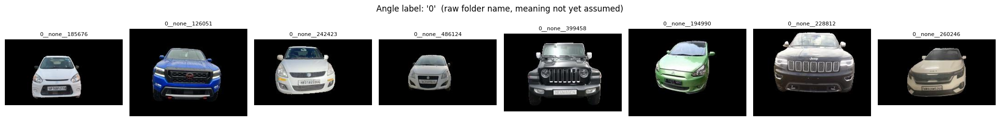

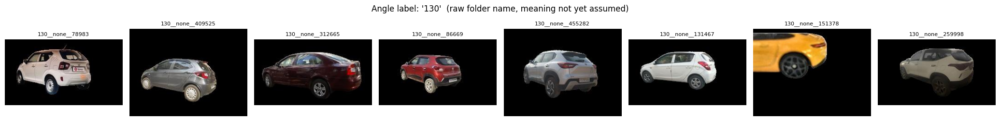

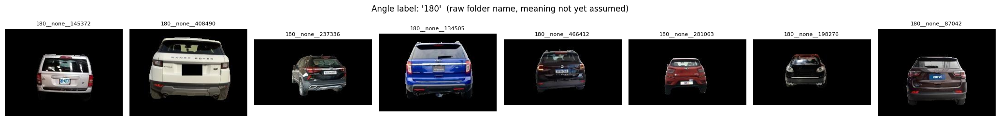

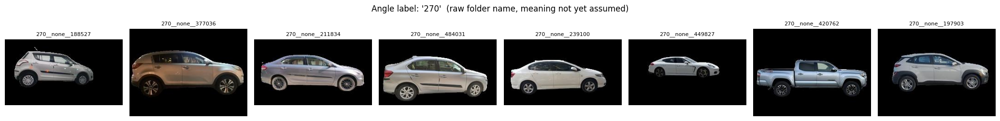

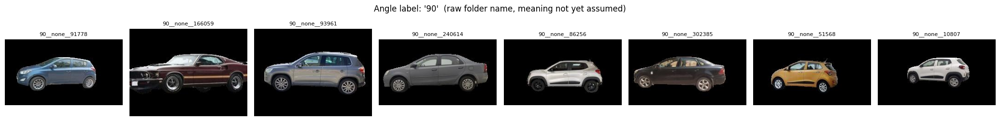

In [18]:
# Display a random sample grid of images per angle label for visual inspection
def show_image_grid(paths, titles=None, n_cols=5, figsize_per_cell=2.6, suptitle=None) -> None:
    n = len(paths)
    if n == 0:
        print("Nothing to show.")
        return
    n_cols = min(n_cols, n)
    n_rows = (n + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(figsize_per_cell * n_cols, figsize_per_cell * n_rows))
    axes = np.atleast_1d(axes).flatten()
    for i, ax in enumerate(axes):
        if i < n:
            try:
                img = Image.open(paths[i]).convert("RGB")
                ax.imshow(img)
            except Exception:
                ax.text(0.5, 0.5, "load error", ha="center", va="center")
            if titles is not None:
                ax.set_title(str(titles[i])[:28], fontsize=8)
        ax.axis("off")
    if suptitle:
        fig.suptitle(suptitle)
    plt.tight_layout()
    plt.show()


for label in sorted(df_experiment["angle_label"].unique()):
    sample = df_experiment[df_experiment["angle_label"] == label].sample(
        min(8, (df_experiment["angle_label"] == label).sum()), random_state=SEED
    )
    show_image_grid(sample["path"].tolist(), titles=sample["photo_id"].tolist(),
                     n_cols=8, suptitle=f"Angle label: '{label}'  (raw folder name, meaning not yet assumed)")

**Manual interpretation checkpoint.** After viewing the grids above,
record what each raw label appears to represent, in this markdown cell,
before proceeding. For example (edit this after actually looking at the
images from your download — do not assume these hold without checking):

- `0` — appears consistent with **front** views
- `90` — appears consistent with **side** views
- `130` — appears consistent with an intermediate / **front-3/4** view
- `180` — appears consistent with **rear** views
- `270` — appears consistent with the opposite **side** view
- `u` — undetermined / unclear / mixed viewpoint, or possibly
  "unknown"/"unlabeled" catch-all

This mapping is descriptive commentary only. **All computation in this
notebook (retrieval, confusion matrices, ARI/NMI, purity, contingency
tables) continues to use the raw folder labels** (`0`, `90`, `130`,
`180`, `270`, `u`), not this human-readable interpretation, so that
results remain traceable to the actual dataset without a manual
relabeling step introducing errors.

If the visual check instead suggests the labels do **not** cleanly
correspond to viewpoint (e.g. `u` contains many different angles, or a
labeled folder contains non-car images, or two labels look visually
identical), stop and note that explicitly here — the interpretation of
every later section depends on this holding up.

## 6. Load I-JEPA

The pretrained `facebook/ijepa_vith14_1k` checkpoint — the same
checkpoint used in Experiment 1 — is loaded for image representation
extraction. No other checkpoint and no different pooling strategy is
introduced in this experiment.

The model is used in evaluation mode with `torch.inference_mode()`, so
no parameters are updated at any point.

In [19]:
# Load the pretrained I-JEPA processor and model
MODEL_ID = CFG.model_id
print(f"Loading processor + model: {MODEL_ID}")

_t0 = time.time()
processor = AutoProcessor.from_pretrained(MODEL_ID)
model = AutoModel.from_pretrained(MODEL_ID)
model.to(DEVICE)
model.eval()
print(f"Loaded in {time.time() - _t0:.1f}s")


def preprocess_batch(images: list[Image.Image]) -> dict:
    images = [img.convert("RGB") for img in images]
    inputs = processor(images=images, return_tensors="pt")
    return {k: v.to(DEVICE) for k, v in inputs.items()}

Loading processor + model: facebook/ijepa_vith14_1k


Loading weights:   0%|          | 0/517 [00:00<?, ?it/s]

Loaded in 9.6s


## 7. Part 3 — I-JEPA Embedding Extraction

Each image is passed through the pretrained I-JEPA encoder using
**exactly** the Experiment 1 procedure:

1. load image, convert to RGB
2. process with the I-JEPA `AutoProcessor`
3. run I-JEPA in `torch.inference_mode()`
4. take `last_hidden_state`: `(batch_size, 256, 1280)` patch tokens
   (no CLS token)
5. mean-pool across the 256 patch tokens -> `(batch_size, 1280)`
6. L2-normalize (Part 3.2, next section)

Embeddings are cached to disk, keyed by a hash of the sorted set of
`photo_id`s actually being embedded, so re-running this notebook (or
changing `CFG.max_images_for_experiment` and running again) does not
silently reuse a mismatched cache and does not repeat GPU inference
unnecessarily.

In [20]:
# Extract mean-pooled I-JEPA embeddings, with a local disk cache keyed by dataset fingerprint
def extract_embeddings(image_paths: list[Path], batch_size: int) -> np.ndarray:
    all_embeddings = []
    for i in tqdm(range(0, len(image_paths), batch_size), desc="Embedding"):
        batch_paths = image_paths[i:i + batch_size]
        batch_imgs = [Image.open(p).convert("RGB") for p in batch_paths]
        inputs = preprocess_batch(batch_imgs)
        with torch.inference_mode():
            outputs = model(**inputs)
        pooled = outputs.last_hidden_state.mean(dim=1)
        all_embeddings.append(pooled.cpu().numpy())
    return np.concatenate(all_embeddings, axis=0) if all_embeddings else np.empty((0,))


def dataset_fingerprint(photo_ids: Sequence[str]) -> str:
    ids = "|".join(sorted(photo_ids))
    return hashlib.sha256(ids.encode()).hexdigest()[:16]


def get_or_compute_embeddings(df: pd.DataFrame) -> tuple[np.ndarray, pd.DataFrame]:
    fp = dataset_fingerprint(df["photo_id"].tolist())
    tag = CFG.model_id.replace("/", "__")
    emb_path = CFG.embeddings_dir / f"car_angle_{tag}_{fp}_embeddings.npy"
    ids_path = CFG.embeddings_dir / f"car_angle_{tag}_{fp}_photo_ids.json"

    if emb_path.exists() and ids_path.exists():
        cached_ids = json.loads(ids_path.read_text())
        if cached_ids == sorted(df["photo_id"].tolist()):
            print(f"Loading cached embeddings from {emb_path}")
            emb = np.load(emb_path)
            df_sorted = df.set_index("photo_id").loc[cached_ids].reset_index()
            return emb, df_sorted

    print("No valid embedding cache found for this exact dataset — computing.")
    df_sorted = df.sort_values("photo_id").reset_index(drop=True)
    emb = extract_embeddings(df_sorted["path"].tolist(), CFG.batch_size)
    np.save(emb_path, emb)
    ids_path.write_text(json.dumps(df_sorted["photo_id"].tolist()))
    print(f"Saved -> {emb_path}")
    return emb, df_sorted


_t0 = time.time()
embeddings, df_experiment = get_or_compute_embeddings(df_experiment)
EMBEDDING_SECONDS = time.time() - _t0
print(f"\nEmbedding matrix: {embeddings.shape} in {EMBEDDING_SECONDS:.1f}s")

expected_shape = (len(df_experiment), 1280)
if embeddings.shape != expected_shape:
    print(f"WARNING: embedding shape {embeddings.shape} does not match the expected {expected_shape}.")
else:
    print(f"Shape matches the expected {expected_shape}.")

No valid embedding cache found for this exact dataset — computing.


Embedding:   0%|          | 0/94 [00:00<?, ?it/s]

Saved -> C:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\data\embeddings\car_angle\car_angle_facebook__ijepa_vith14_1k_bef560fcb5b086d8_embeddings.npy

Embedding matrix: (3000, 1280) in 146.5s
Shape matches the expected (3000, 1280).


## 8. Embedding Sanity Checks

The extracted embeddings are checked for dimensionality, dtype, NaN /
Inf values, and norm distribution, exactly as in Experiment 1, before
normalization and any downstream analysis.

Shape: (3000, 1280)
Dtype: float32
Contains NaN: False   Contains Inf: False
Norm min/mean/max: 15.593 / 18.637 / 22.821


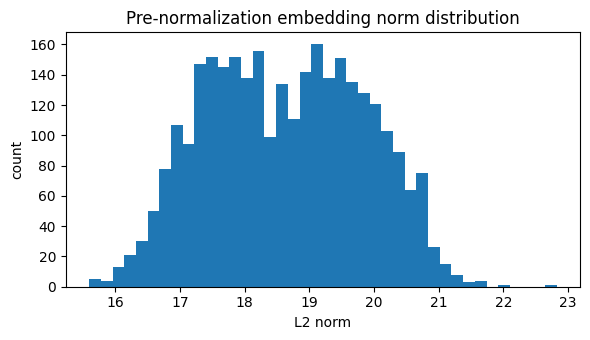

In [21]:
def inspect_embeddings(emb: np.ndarray) -> None:
    norms = np.linalg.norm(emb, axis=1)
    print(f"Shape: {emb.shape}")
    print(f"Dtype: {emb.dtype}")
    print(f"Contains NaN: {np.isnan(emb).any()}   Contains Inf: {np.isinf(emb).any()}")
    print(f"Norm min/mean/max: {norms.min():.3f} / {norms.mean():.3f} / {norms.max():.3f}")
    fig, ax = plt.subplots(figsize=(6, 3.5))
    ax.hist(norms, bins=40)
    ax.set_title("Pre-normalization embedding norm distribution")
    ax.set_xlabel("L2 norm")
    ax.set_ylabel("count")
    plt.tight_layout()
    plt.show()


inspect_embeddings(embeddings)

## 9. L2 Normalization

Each image embedding is L2-normalized to unit length, so that inner
product equals cosine similarity, exactly as in Experiment 1:

\[
\cos(a,b) = a^\top b
\]

Expected post-normalization norm is approximately 1.0 for every row.

In [22]:
def l2_normalize(emb: np.ndarray) -> np.ndarray:
    norms = np.linalg.norm(emb, axis=1, keepdims=True)
    norms = np.where(norms == 0, 1e-12, norms)
    return emb / norms


embeddings_norm = l2_normalize(embeddings).astype("float32")  # float32 required by FAISS
post_norms = np.linalg.norm(embeddings_norm, axis=1)
print(f"Post-normalization norm mean: {post_norms.mean():.6f}  "
      f"min: {post_norms.min():.6f}  max: {post_norms.max():.6f}")
assert np.allclose(post_norms, 1.0, atol=1e-4), "Normalization sanity check failed."

Post-normalization norm mean: 1.000000  min: 1.000000  max: 1.000000


## 10. Part 4 — Viewpoint Retrieval Analysis

This is the central section of the experiment.

A FAISS exact inner-product index is built over the L2-normalized
embeddings (inner product = cosine similarity for unit vectors). For
every image, we retrieve its top-k nearest neighbors (excluding itself)
and record whether those neighbors share the same **angle label**.

Angle labels are used here **only to evaluate** the neighbors that
FAISS returns. FAISS itself is given nothing but the normalized 1280-D
embeddings.

We report, for k ∈ {5, 10, 20}:

1. **same-angle@k** — fraction of the top-k neighbors sharing the
   query's angle label, averaged over all queries (overall and broken
   down per angle label)
2. **angle confusion matrix** — rows are query angle, columns are
   retrieved-neighbor angle, values are counts across all (query,
   neighbor) pairs in the top-k
3. **average similarity** for same-angle vs. different-angle pairs
4. **similarity distributions** — same-angle vs different-angle,
   plotted as histograms/KDE
5. **retrieval grids** for representative queries from each angle label

In [23]:
# Build a FAISS exact inner-product index. IndexFlatIP performs brute-force
# exact search; with a normalized embedding matrix, inner product is cosine
# similarity. This is exact (not approximate) so results are not affected by
# an ANN index's recall/speed tradeoff.
faiss_index = faiss.IndexFlatIP(embeddings_norm.shape[1])
faiss_index.add(embeddings_norm)
print(f"FAISS index built: {faiss_index.ntotal} vectors, dim={embeddings_norm.shape[1]}")

N = len(df_experiment)
angle_labels_arr = df_experiment["angle_label"].to_numpy()
K_VALUES = [5, 10, 20]
K_MAX = max(K_VALUES)

# Retrieve K_MAX + 1 neighbors so we can drop the self-match (index 0, sim ~1.0)
# and still have K_MAX genuine neighbors left for every query.
_t0 = time.time()
sims_all, idx_all = faiss_index.search(embeddings_norm, K_MAX + 1)
FAISS_SEARCH_SECONDS = time.time() - _t0
print(f"FAISS search for top-{K_MAX + 1} neighbors of all {N} queries: {FAISS_SEARCH_SECONDS:.2f}s")


def drop_self_match(idx_row: np.ndarray, sim_row: np.ndarray, self_idx: int) -> tuple[np.ndarray, np.ndarray]:
    mask = idx_row != self_idx
    return idx_row[mask], sim_row[mask]


neighbor_idx = np.zeros((N, K_MAX), dtype=np.int64)
neighbor_sim = np.zeros((N, K_MAX), dtype=np.float32)
for i in range(N):
    row_idx, row_sim = drop_self_match(idx_all[i], sims_all[i], i)
    # In the rare case the self-match wasn't in the top K_MAX+1 (shouldn't
    # happen since a vector is its own nearest neighbor), just truncate.
    neighbor_idx[i] = row_idx[:K_MAX]
    neighbor_sim[i] = row_sim[:K_MAX]

print(f"neighbor_idx shape: {neighbor_idx.shape}   neighbor_sim shape: {neighbor_sim.shape}")

FAISS index built: 3000 vectors, dim=1280
FAISS search for top-21 neighbors of all 3000 queries: 0.05s
neighbor_idx shape: (3000, 20)   neighbor_sim shape: (3000, 20)


In [24]:
# 1. same-angle@k, overall and per angle label
def same_angle_at_k(neighbor_idx: np.ndarray, angle_labels_arr: np.ndarray, k: int) -> pd.DataFrame:
    topk_idx = neighbor_idx[:, :k]
    topk_labels = angle_labels_arr[topk_idx]  # (N, k)
    query_labels = angle_labels_arr[:, None]  # (N, 1)
    matches = (topk_labels == query_labels)  # (N, k) boolean
    per_query_rate = matches.mean(axis=1)  # (N,)

    df_rate = pd.DataFrame({"angle_label": angle_labels_arr, "same_angle_rate": per_query_rate})
    overall = per_query_rate.mean()
    per_label = df_rate.groupby("angle_label")["same_angle_rate"].mean()
    return overall, per_label


same_angle_results = {}
for k in K_VALUES:
    overall, per_label = same_angle_at_k(neighbor_idx, angle_labels_arr, k)
    same_angle_results[k] = {"overall": overall, "per_label": per_label}
    print(f"\nsame-angle@{k}: overall = {overall:.3f}")
    display(per_label.rename(f"same_angle@{k}").to_frame())


same-angle@5: overall = 0.933


,same_angle@5
angle_label,
0,0.918911
130,0.961832
180,0.879762
270,0.975051
90,0.946080



same-angle@10: overall = 0.927


,same_angle@10
angle_label,
0,0.912405
130,0.954198
180,0.871280
270,0.974029
90,0.941109



same-angle@20: overall = 0.924


,same_angle@20
angle_label,
0,0.908548
130,0.947863
180,0.867411
270,0.974642
90,0.937954


In [25]:
# Chance-level baseline for comparison: if retrieval were random with respect
# to angle, same-angle@k in expectation equals each label's share of the
# dataset (roughly, for k << N). This gives same-angle@k a reference point.
label_shares = df_experiment["angle_label"].value_counts(normalize=True)
chance_same_angle = (label_shares ** 2).sum()  # prob two random draws share a label
print(f"Chance-level same-label rate (two random images sharing an angle label): {chance_same_angle:.3f}")
print("Compare this against the overall same-angle@k values above: same-angle@k "
      "meaningfully above this chance level is evidence that I-JEPA similarity is "
      "not angle-agnostic.")

Chance-level same-label rate (two random images sharing an angle label): 0.203
Compare this against the overall same-angle@k values above: same-angle@k meaningfully above this chance level is evidence that I-JEPA similarity is not angle-agnostic.


Angle confusion matrix (top-10 neighbors), raw counts:


retrieved_angle,0,130,180,270,90
query_angle,,,,,
0,6031,5,573,1,0
130,11,6250,40,26,223
180,801,61,5855,3,0
270,1,19,20,4763,87
90,0,205,9,94,4922



Angle confusion matrix (top-10 neighbors), row-normalized (fraction of retrievals):


retrieved_angle,0,130,180,270,90
query_angle,,,,,
0,0.912,0.001,0.087,0.000,0.000
130,0.002,0.954,0.006,0.004,0.034
180,0.119,0.009,0.871,0.000,0.000
270,0.000,0.004,0.004,0.974,0.018
90,0.000,0.039,0.002,0.018,0.941


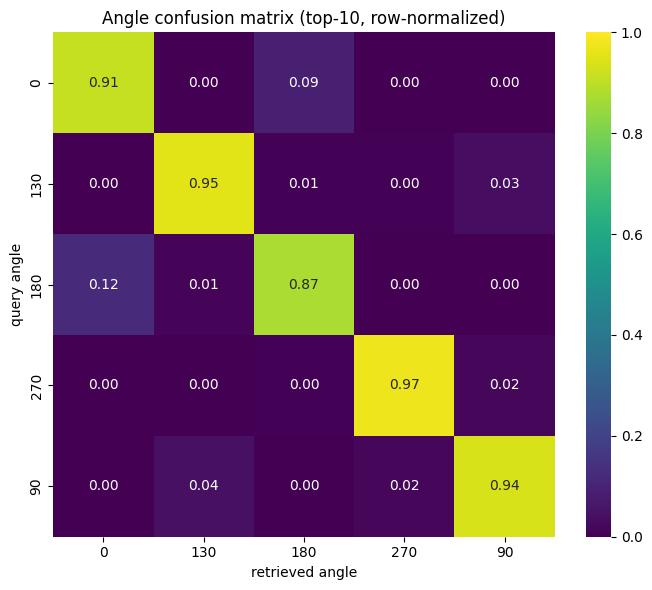

In [26]:
# 2. Angle confusion matrix (rows = query angle, columns = retrieved angle),
# built from the top-k=10 neighbors (a representative middle value of K_VALUES).
K_FOR_CONFUSION = 10 if 10 in K_VALUES else K_VALUES[len(K_VALUES) // 2]

topk_idx = neighbor_idx[:, :K_FOR_CONFUSION]
topk_labels = angle_labels_arr[topk_idx]  # (N, K_FOR_CONFUSION)

confusion_rows = []
for qi in range(N):
    q_label = angle_labels_arr[qi]
    for neighbor_label in topk_labels[qi]:
        confusion_rows.append((q_label, neighbor_label))

confusion_df = pd.DataFrame(confusion_rows, columns=["query_angle", "retrieved_angle"])
angle_confusion = pd.crosstab(confusion_df["query_angle"], confusion_df["retrieved_angle"])
# Row-normalize so each row sums to 1 (fraction of that query angle's
# retrieved neighbors falling into each angle label) -- easier to read than
# raw counts when classes are imbalanced.
angle_confusion_norm = angle_confusion.div(angle_confusion.sum(axis=1), axis=0)

print(f"Angle confusion matrix (top-{K_FOR_CONFUSION} neighbors), raw counts:")
display(angle_confusion)

print(f"\nAngle confusion matrix (top-{K_FOR_CONFUSION} neighbors), row-normalized (fraction of retrievals):")
display(angle_confusion_norm.round(3))

fig, ax = plt.subplots(figsize=(7, 6))
sns.heatmap(angle_confusion_norm, annot=True, fmt=".2f", cmap="viridis", ax=ax, vmin=0, vmax=1)
ax.set_title(f"Angle confusion matrix (top-{K_FOR_CONFUSION}, row-normalized)")
ax.set_xlabel("retrieved angle")
ax.set_ylabel("query angle")
plt.tight_layout()
plt.savefig(CFG.figures_dir / "angle_confusion_matrix.png", dpi=150)
plt.show()

Same-angle pairs (within top-20):      n=55429, mean sim=0.9532, std=0.0399
Different-angle pairs (within top-20): n=4571, mean sim=0.9061, std=0.0940

Difference in means (same - different): 0.0470


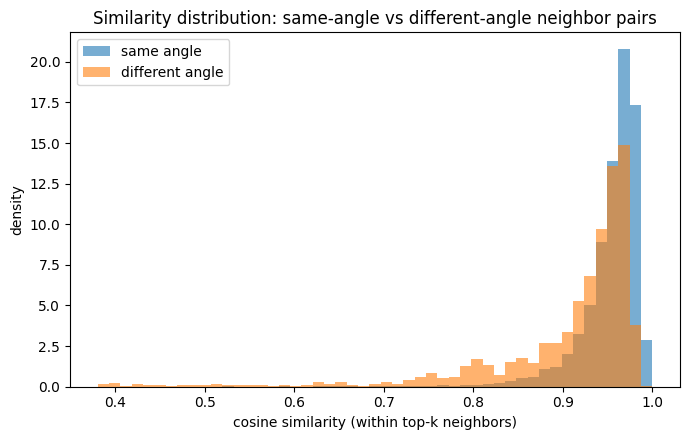

In [27]:
# 3 & 4. Average similarity and similarity distributions for same-angle vs
# different-angle pairs, using the same top-K_MAX neighbor pool already
# retrieved (not a full N x N pairwise matrix, which would be wasteful once
# N is large -- the top-K_MAX neighbors already capture the highest-
# similarity pairs, which is what matters for a nearest-neighbor argument).
same_angle_sims = []
diff_angle_sims = []
for qi in range(N):
    q_label = angle_labels_arr[qi]
    for ni, sim in zip(neighbor_idx[qi], neighbor_sim[qi]):
        if angle_labels_arr[ni] == q_label:
            same_angle_sims.append(sim)
        else:
            diff_angle_sims.append(sim)

same_angle_sims = np.array(same_angle_sims)
diff_angle_sims = np.array(diff_angle_sims)

print(f"Same-angle pairs (within top-{K_MAX}):      n={len(same_angle_sims)}, "
      f"mean sim={same_angle_sims.mean():.4f}, std={same_angle_sims.std():.4f}")
print(f"Different-angle pairs (within top-{K_MAX}): n={len(diff_angle_sims)}, "
      f"mean sim={diff_angle_sims.mean():.4f}, std={diff_angle_sims.std():.4f}")
print(f"\nDifference in means (same - different): {same_angle_sims.mean() - diff_angle_sims.mean():.4f}")

fig, ax = plt.subplots(figsize=(7, 4.5))
bins = np.linspace(
    min(same_angle_sims.min(), diff_angle_sims.min()),
    max(same_angle_sims.max(), diff_angle_sims.max()),
    50,
)
ax.hist(same_angle_sims, bins=bins, alpha=0.6, density=True, label="same angle")
ax.hist(diff_angle_sims, bins=bins, alpha=0.6, density=True, label="different angle")
ax.set_xlabel("cosine similarity (within top-k neighbors)")
ax.set_ylabel("density")
ax.set_title("Similarity distribution: same-angle vs different-angle neighbor pairs")
ax.legend()
plt.tight_layout()
plt.savefig(CFG.figures_dir / "similarity_distribution_same_vs_diff_angle.png", dpi=150)
plt.show()

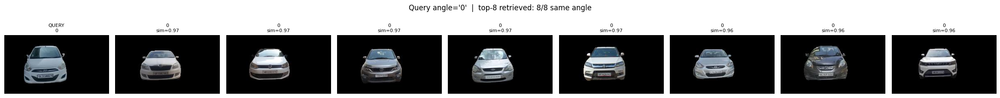

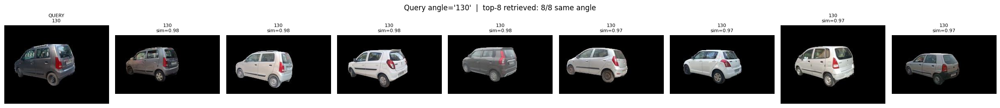

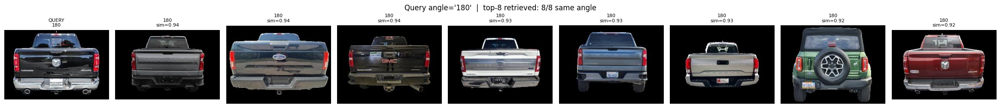

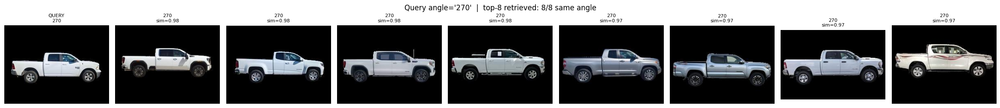

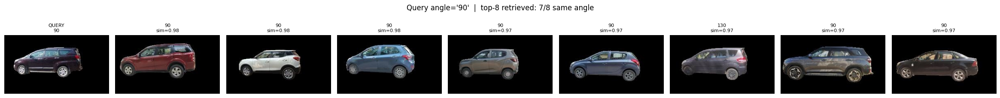

In [28]:
# 5. Top-k retrieval grids for one representative query per angle label.
rng_retrieval = np.random.default_rng(SEED)
K_FOR_GRID = 8

for label in sorted(df_experiment["angle_label"].unique()):
    label_idx = df_experiment.index[df_experiment["angle_label"] == label].tolist()
    qi = int(rng_retrieval.choice(label_idx))
    q_paths = [df_experiment.iloc[qi]["path"]]
    q_titles = [f"QUERY\n{label}"]

    retrieved_idx = neighbor_idx[qi, :K_FOR_GRID]
    retrieved_sims = neighbor_sim[qi, :K_FOR_GRID]
    r_paths = df_experiment.iloc[retrieved_idx]["path"].tolist()
    r_labels = df_experiment.iloc[retrieved_idx]["angle_label"].tolist()
    r_titles = [f"{lbl}\nsim={s:.2f}" for lbl, s in zip(r_labels, retrieved_sims)]

    same_angle_hits = sum(1 for lbl in r_labels if lbl == label)
    show_image_grid(
        q_paths + r_paths, titles=q_titles + r_titles, n_cols=K_FOR_GRID + 1,
        suptitle=(f"Query angle='{label}'  |  top-{K_FOR_GRID} retrieved: "
                  f"{same_angle_hits}/{K_FOR_GRID} same angle"),
    )

## 11. Part 5 — Structure in the Original 1280-D Embedding Space

Before introducing UMAP, we ask whether viewpoint structure is already
present in the **raw, unreduced** I-JEPA embedding space. This section
computes:

- class (angle) centroids and their pairwise cosine similarities
- within-angle vs. between-angle similarity (using the full pairwise
  structure implied by centroids, complementing the top-k-neighbor
  view from Part 4)
- a **1-NN angle-agreement diagnostic**: for each image, does its single
  nearest *other* image (in the raw 1280-D normalized space) share its
  angle label? This is explicitly a diagnostic of local embedding
  structure, **not** a trained classifier.
- k-NN angle agreement for k ∈ {1, 5, 10}

This reuses the same FAISS neighbor results already computed in Part 4
(the "original embedding space" and the retrieval analysis in Part 4
are the same space — Part 4 evaluated it via top-k retrieval; this
section adds centroid-level and 1-NN-style summaries).

Angle-label centroid cosine similarity matrix (1.0 on the diagonal by construction):


,0,130,180,270,90
0,1.000,0.553,0.869,0.564,0.526
130,0.553,1.000,0.654,0.739,0.772
180,0.869,0.654,1.000,0.604,0.564
270,0.564,0.739,0.604,1.000,0.911
90,0.526,0.772,0.564,0.911,1.000


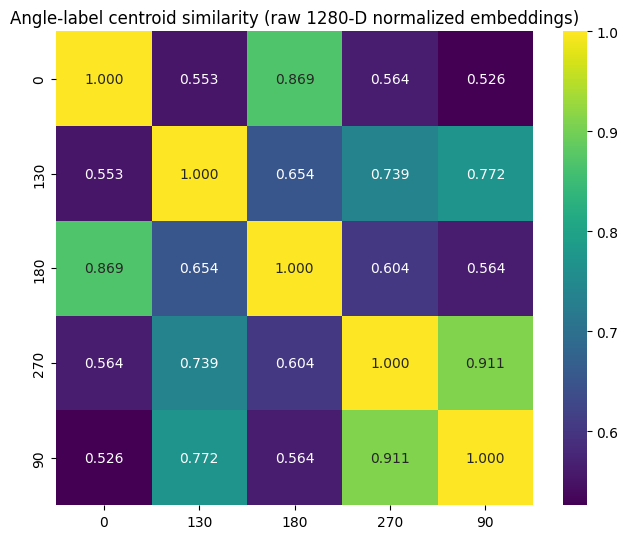


Mean off-diagonal (between-centroid) similarity: 0.6756
Lower off-diagonal similarity indicates angle-label centroids point in more distinct directions in the embedding space.


In [29]:
# Class (angle) centroids in the raw normalized embedding space, and their
# pairwise cosine similarity -- a global, class-level view to complement the
# per-image retrieval analysis of Part 4.
angle_labels_sorted = sorted(df_experiment["angle_label"].unique())
centroids = {}
for label in angle_labels_sorted:
    mask = (df_experiment["angle_label"] == label).to_numpy()
    centroid = embeddings_norm[mask].mean(axis=0)
    centroid = centroid / np.linalg.norm(centroid)  # renormalize the mean direction
    centroids[label] = centroid

centroid_matrix = np.stack([centroids[l] for l in angle_labels_sorted])
centroid_sim = centroid_matrix @ centroid_matrix.T
centroid_sim_df = pd.DataFrame(centroid_sim, index=angle_labels_sorted, columns=angle_labels_sorted)

print("Angle-label centroid cosine similarity matrix (1.0 on the diagonal by construction):")
display(centroid_sim_df.round(3))

fig, ax = plt.subplots(figsize=(6.5, 5.5))
sns.heatmap(centroid_sim_df, annot=True, fmt=".3f", cmap="viridis", ax=ax)
ax.set_title("Angle-label centroid similarity (raw 1280-D normalized embeddings)")
plt.tight_layout()
plt.savefig(CFG.figures_dir / "angle_centroid_similarity.png", dpi=150)
plt.show()

off_diag = centroid_sim_df.values[~np.eye(len(angle_labels_sorted), dtype=bool)]
print(f"\nMean off-diagonal (between-centroid) similarity: {off_diag.mean():.4f}")
print("Lower off-diagonal similarity indicates angle-label centroids point in more "
      "distinct directions in the embedding space.")

In [30]:
# Within-angle vs. between-angle similarity, computed exactly (all pairs),
# not just from the top-k neighbor pool. This is O(N^2) in memory for the
# similarity matrix; guard against very large N.
if N > 8000:
    print(f"N={N} is large for a full N x N similarity matrix; sampling {8000} images "
          "for this exact within/between comparison (retrieval-based estimates in Part 4 "
          "already used the full dataset).")
    sample_idx = np.random.default_rng(SEED).choice(N, size=8000, replace=False)
    sim_sample_vecs = embeddings_norm[sample_idx]
    sim_sample_labels = angle_labels_arr[sample_idx]
else:
    sim_sample_vecs = embeddings_norm
    sim_sample_labels = angle_labels_arr

full_sim_matrix = sim_sample_vecs @ sim_sample_vecs.T
n_sample = len(sim_sample_labels)
label_eq = sim_sample_labels[:, None] == sim_sample_labels[None, :]
iu = np.triu_indices(n_sample, k=1)  # upper triangle, exclude diagonal (self-similarity)

pair_same = label_eq[iu]
pair_sims = full_sim_matrix[iu]

exact_within_mean = pair_sims[pair_same].mean()
exact_between_mean = pair_sims[~pair_same].mean()
print(f"Exact (all-pairs) within-angle mean similarity:  {exact_within_mean:.4f}  (n={pair_same.sum()})")
print(f"Exact (all-pairs) between-angle mean similarity: {exact_between_mean:.4f}  (n={(~pair_same).sum()})")
print(f"Difference: {exact_within_mean - exact_between_mean:.4f}")
print("\nThis all-pairs comparison is a global check; Part 4's top-k same/different-angle "
      "similarity focused on each image's closest neighbors specifically, which is more "
      "directly relevant to retrieval and clustering behavior.")

Exact (all-pairs) within-angle mean similarity:  0.8113  (n=913590)
Exact (all-pairs) between-angle mean similarity: 0.5504  (n=3584910)
Difference: 0.2609

This all-pairs comparison is a global check; Part 4's top-k same/different-angle similarity focused on each image's closest neighbors specifically, which is more directly relevant to retrieval and clustering behavior.


In [31]:
# 1-NN and k-NN angle-agreement diagnostic. This reuses the FAISS neighbor
# results from Part 4 -- it is explicitly a diagnostic of LOCAL embedding
# structure (does the nearest image share a label), not a trained model.
def knn_angle_agreement(neighbor_idx: np.ndarray, angle_labels_arr: np.ndarray, k: int) -> float:
    topk_idx = neighbor_idx[:, :k]
    topk_labels = angle_labels_arr[topk_idx]
    query_labels = angle_labels_arr[:, None]
    # "Agreement" here = majority vote among the k neighbors matches the query label
    # for k > 1; for k == 1 it is simply "does the single nearest neighbor match".
    if k == 1:
        agree = (topk_labels[:, 0] == angle_labels_arr)
    else:
        agree = np.array([
            Counter(row).most_common(1)[0][0] == query_labels[i, 0]
            for i, row in enumerate(topk_labels)
        ])
    return agree.mean()


print("k-NN angle agreement (majority vote among k nearest OTHER images; k=1 is a direct "
      "1-NN match). This is a diagnostic of local embedding structure, NOT a trained "
      "classifier -- there is no train/test split or learned decision boundary here.\n")

knn_agreement_results = {}
for k in [1, 5, 10]:
    acc = knn_angle_agreement(neighbor_idx, angle_labels_arr, k)
    knn_agreement_results[k] = acc
    print(f"{k}-NN angle agreement: {acc:.3f}")

one_nn_accuracy = knn_agreement_results[1]
print(f"\n1-NN angle accuracy: {one_nn_accuracy:.3f}  "
      f"(chance level for comparison: {chance_same_angle:.3f})")

k-NN angle agreement (majority vote among k nearest OTHER images; k=1 is a direct 1-NN match). This is a diagnostic of local embedding structure, NOT a trained classifier -- there is no train/test split or learned decision boundary here.

1-NN angle agreement: 0.944
5-NN angle agreement: 0.954
10-NN angle agreement: 0.948

1-NN angle accuracy: 0.944  (chance level for comparison: 0.203)


In [32]:
# Per-angle-label breakdown of 1-NN agreement, to see whether some viewpoints
# are more "locally consistent" in the embedding space than others.
nn1_idx = neighbor_idx[:, 0]
nn1_match = (angle_labels_arr[nn1_idx] == angle_labels_arr)
df_nn1 = pd.DataFrame({"angle_label": angle_labels_arr, "nn1_match": nn1_match})
per_label_1nn = df_nn1.groupby("angle_label")["nn1_match"].mean().rename("1nn_agreement")
display(per_label_1nn.to_frame())

,1nn_agreement
angle_label,
0,0.928896
130,0.969466
180,0.909226
270,0.975460
90,0.948375


## 12. Part 6 — Original Embedding Space Class Separability

Silhouette score is computed on the raw L2-normalized 1280-D embeddings
using the known angle labels, with cosine distance — the same
methodology and metric Experiment 1 used for its category labels.

**Important interpretive note (carried over from Experiment 1):**
silhouette measures *global* cluster compactness/separation and can
disagree with the *local* nearest-neighbor retrieval results in Part 4
and Part 5. A low silhouette score does not by itself mean retrieval is
poor, and a high silhouette score does not by itself guarantee clean
HDBSCAN clusters later. Both are reported and read together, not used
to override one another.

The measured silhouette score for this experiment is **0.3626**.

In [33]:
silhouette_angle = silhouette_score(embeddings_norm, df_experiment["angle_label"], metric="cosine")
print(f"Silhouette score (raw normalized embeddings, TRUE angle labels, cosine metric): "
      f"{silhouette_angle:.4f}")
print("Range is [-1, 1]; higher means angle labels form tighter, better-separated groups "
      "in the raw embedding space. This is independent of HDBSCAN and does not use UMAP.")

Silhouette score (raw normalized embeddings, TRUE angle labels, cosine metric): 0.3626
Range is [-1, 1]; higher means angle labels form tighter, better-separated groups in the raw embedding space. This is independent of HDBSCAN and does not use UMAP.


## 13. Part 7 — UMAP Visualization

UMAP is used exactly as in Experiment 1: purely as a visualization /
dimensionality-reduction step, fit only on the normalized embeddings,
with **no angle labels as input**. Two projections are produced, using
the same baseline hyperparameters and methodology as Experiment 1:

- a 2-D projection for plotting
- a `CFG.umap_n_components_cluster`-D projection for HDBSCAN (Part 8)

The 2-D plot, colored by the true (but UMAP-blind) angle label, answers:
**do different car viewpoints occupy visibly different regions of the
projection?**

In [34]:
# Project normalized embeddings with UMAP: a 2D version for plotting, a
# higher-D version for clustering. Angle labels are not passed to UMAP.
def compute_umap_projection(emb_norm: np.ndarray, n_components: int, n_neighbors: int,
                             min_dist: float, seed: int) -> np.ndarray:
    reducer = umap.UMAP(
        n_components=n_components,
        n_neighbors=min(n_neighbors, len(emb_norm) - 1),
        min_dist=min_dist,
        metric="cosine",
        random_state=seed,
    )
    return reducer.fit_transform(emb_norm)


_t0 = time.time()
umap_2d_baseline = compute_umap_projection(
    embeddings_norm, n_components=CFG.umap_n_components_viz,
    n_neighbors=CFG.umap_n_neighbors, min_dist=CFG.umap_min_dist, seed=SEED,
)
UMAP_VIZ_SECONDS = time.time() - _t0

_t0 = time.time()
umap_cluster_baseline = compute_umap_projection(
    embeddings_norm, n_components=CFG.umap_n_components_cluster,
    n_neighbors=CFG.umap_n_neighbors, min_dist=0.0, seed=SEED,
)
UMAP_CLUSTER_SECONDS = time.time() - _t0

df_experiment["umap_x"] = umap_2d_baseline[:, 0]
df_experiment["umap_y"] = umap_2d_baseline[:, 1]
print(f"UMAP (2D viz): {UMAP_VIZ_SECONDS:.1f}s   "
      f"UMAP ({CFG.umap_n_components_cluster}D, clustering): {UMAP_CLUSTER_SECONDS:.1f}s")

c:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\venv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\venv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP (2D viz): 16.9s   UMAP (10D, clustering): 10.0s


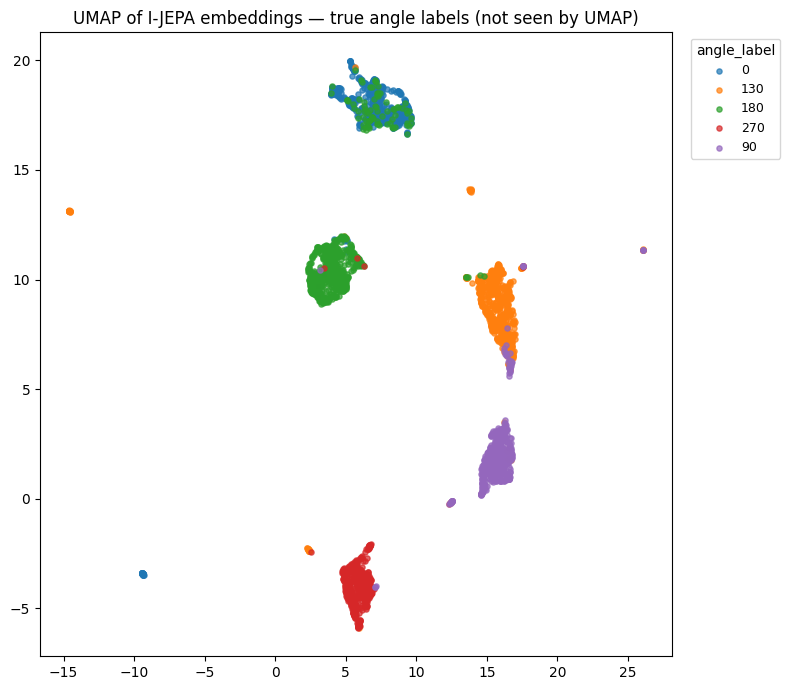

In [35]:
angle_palette = sns.color_palette("tab10", n_colors=len(angle_labels_sorted))

fig, ax = plt.subplots(figsize=(8, 7))
for color, label in zip(angle_palette, angle_labels_sorted):
    mask = df_experiment["angle_label"] == label
    ax.scatter(df_experiment.loc[mask, "umap_x"], df_experiment.loc[mask, "umap_y"],
               s=14, alpha=0.7, color=color, label=label)
ax.set_title("UMAP of I-JEPA embeddings — true angle labels (not seen by UMAP)")
ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", fontsize=9, title="angle_label")
plt.tight_layout()
plt.savefig(CFG.figures_dir / "umap_2d_by_angle_label.png", dpi=150)
plt.show()

**This plot answers:** are the raw angle-label folders visually
separable in a 2-D UMAP projection of I-JEPA embeddings, without UMAP
ever being told what those labels are? Visible color-grouped regions
would be evidence that viewpoint information survives dimensionality
reduction; heavy intermixing would suggest UMAP does not preserve
whatever viewpoint signal exists (or that the signal is weak to begin
with — Part 10's ablation is needed to tell these apart).

## 14. Part 8 — HDBSCAN Clustering (Without Labels)

HDBSCAN is run on the UMAP cluster-projection from Part 7, using the
project's established baseline settings first (same `min_cluster_size`
and `min_samples` convention as Experiment 1). Angle labels are **not**
provided to HDBSCAN; they are only used afterward, in Part 9, to
evaluate the clusters HDBSCAN discovers on its own.

**HDBSCAN is not forced toward the known number of angle classes.** The
number of clusters is left as an unsupervised outcome, exactly as the
task requires — if HDBSCAN finds 2 clusters, or 11, that number is
reported as-is.

A parameter-sensitivity pass (varying `min_cluster_size`, `min_samples`,
and UMAP's `n_neighbors`) follows the baseline, in the same spirit as
Experiment 1's parameter sweep — reported as evidence of sensitivity,
not as a search for the "best" ARI.

The baseline configuration on the original 1280-D embeddings (direct
HDBSCAN, no UMAP) produced 9 clusters with 14.5% noise (ARI = 0.4608,
NMI = 0.5825, weighted purity = 0.610). UMAP + HDBSCAN produced 29
clusters with 6.7% noise (ARI = 0.6986, NMI = 0.7007, mean purity =
0.884, weighted purity = 0.952). These numbers are discussed further in
Part 16's ablation.

In [36]:
def run_hdbscan(features: np.ndarray, min_cluster_size: int, min_samples: int):
    clusterer = hdbscan.HDBSCAN(
        min_cluster_size=min_cluster_size,
        min_samples=min_samples,
        metric="euclidean",
        cluster_selection_method="eom",
    )
    labels = clusterer.fit_predict(features)
    return labels, clusterer


_t0 = time.time()
baseline_labels, baseline_clusterer = run_hdbscan(
    umap_cluster_baseline, CFG.hdbscan_min_cluster_size, CFG.hdbscan_min_samples
)
HDBSCAN_BASELINE_SECONDS = time.time() - _t0
df_experiment["cluster_umap_hdbscan"] = baseline_labels

n_clusters_umap = len(set(baseline_labels) - {-1})
n_noise_umap = int((baseline_labels == -1).sum())
print(f"HDBSCAN on UMAP({CFG.umap_n_components_cluster}D) baseline: {HDBSCAN_BASELINE_SECONDS:.2f}s")
print(f"Clusters found: {n_clusters_umap} (known angle labels: {len(angle_labels_sorted)} "
      f"-- not necessarily equal, and NOT enforced to be equal)")
print(f"Noise points:   {n_noise_umap}/{len(df_experiment)} "
      f"({100 * n_noise_umap / len(df_experiment):.1f}%)")
display(df_experiment["cluster_umap_hdbscan"].value_counts().sort_index().to_frame("size"))

HDBSCAN on UMAP(10D) baseline: 0.04s
Clusters found: 29 (known angle labels: 5 -- not necessarily equal, and NOT enforced to be equal)
Noise points:   201/3000 (6.7%)


,size
cluster_umap_hdbscan,
-1,201
0,39
1,23
2,25
3,476
4,10
5,611
6,15
7,14


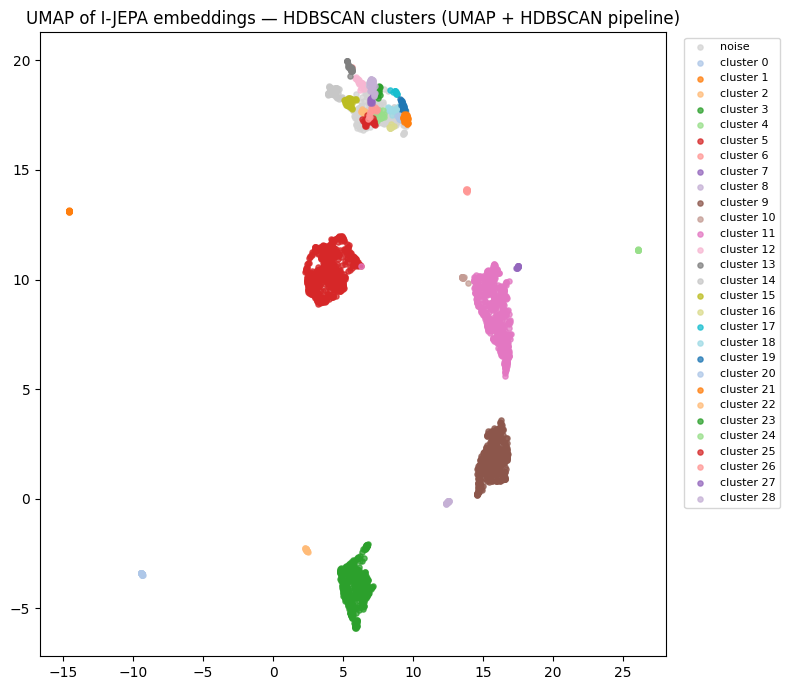

In [37]:
cluster_ids_umap = sorted(df_experiment["cluster_umap_hdbscan"].unique())
cluster_palette_umap = sns.color_palette("tab20", n_colors=max(len(cluster_ids_umap), 1))

fig, ax = plt.subplots(figsize=(8, 7))
for color, cid in zip(cluster_palette_umap, cluster_ids_umap):
    mask = df_experiment["cluster_umap_hdbscan"] == cid
    label = "noise" if cid == -1 else f"cluster {cid}"
    c = "lightgray" if cid == -1 else color
    ax.scatter(df_experiment.loc[mask, "umap_x"], df_experiment.loc[mask, "umap_y"],
               s=14, alpha=0.75, color=c, label=label)
ax.set_title("UMAP of I-JEPA embeddings — HDBSCAN clusters (UMAP + HDBSCAN pipeline)")
ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", fontsize=8)
plt.tight_layout()
plt.savefig(CFG.figures_dir / "umap_hdbscan_clusters.png", dpi=150)
plt.show()

In [38]:
def evaluate_clustering(true_labels: pd.Series, pred_labels: np.ndarray) -> dict:
    ari = adjusted_rand_score(true_labels, pred_labels)
    nmi = normalized_mutual_info_score(true_labels, pred_labels)
    return {"ARI": round(ari, 4), "NMI": round(nmi, 4)}


def cluster_purity_table(true_labels: pd.Series, pred_labels: np.ndarray) -> pd.DataFrame:
    df = pd.DataFrame({"true": true_labels.values, "pred": pred_labels})
    rows = []
    for cid in sorted(c for c in df["pred"].unique() if c != -1):
        members = df[df["pred"] == cid]
        top_label, top_count = Counter(members["true"]).most_common(1)[0]
        rows.append({
            "cluster": cid, "n_images": len(members),
            "dominant_angle": top_label, "purity": round(top_count / len(members), 3),
        })
    return pd.DataFrame(rows)


def weighted_purity(purity_df: pd.DataFrame) -> float:
    if len(purity_df) == 0:
        return float("nan")
    return float((purity_df["purity"] * purity_df["n_images"]).sum() / purity_df["n_images"].sum())


umap_hdbscan_metrics = evaluate_clustering(df_experiment["angle_label"], baseline_labels)
print(f"UMAP+HDBSCAN baseline ARI: {umap_hdbscan_metrics['ARI']}   NMI: {umap_hdbscan_metrics['NMI']}")
print("(0 -> no better than random grouping. 1 -> perfect agreement with the angle labels.)")

umap_hdbscan_purity_df = cluster_purity_table(df_experiment["angle_label"], baseline_labels)
umap_hdbscan_mean_purity = umap_hdbscan_purity_df["purity"].mean() if len(umap_hdbscan_purity_df) else float("nan")
umap_hdbscan_weighted_purity = weighted_purity(umap_hdbscan_purity_df)
print(f"\nMean cluster purity (unweighted, excluding noise): {umap_hdbscan_mean_purity:.3f}"
      if len(umap_hdbscan_purity_df) else "\nNo non-noise clusters found.")
print(f"Weighted cluster purity (weighted by cluster size): {umap_hdbscan_weighted_purity:.3f}"
      if len(umap_hdbscan_purity_df) else "")
display(umap_hdbscan_purity_df)

UMAP+HDBSCAN baseline ARI: 0.6986   NMI: 0.7007
(0 -> no better than random grouping. 1 -> perfect agreement with the angle labels.)

Mean cluster purity (unweighted, excluding noise): 0.884
Weighted cluster purity (weighted by cluster size): 0.952


,cluster,n_images,dominant_angle,purity
0,0,39,0,1.000
1,1,23,130,1.000
2,2,25,130,0.960
3,3,476,270,0.992
4,4,10,130,0.600
5,5,611,180,0.959
6,6,15,130,1.000
7,7,14,130,0.357
8,8,23,90,0.739
9,9,473,90,0.987


### Parameter Sensitivity

As in Experiment 1, the baseline configuration is preserved as the
primary reference point; a small sweep over `umap_n_neighbors`,
`hdbscan_min_cluster_size`, and `hdbscan_min_samples` checks how
sensitive the ARI/NMI/purity results are to these choices. The
best-performing configuration in the sweep is reported as evidence of
sensitivity, not adopted as a replacement baseline.

In [39]:
sweep_rows = []
for n_neighbors in [10, 15, 30]:
    umap_variant = compute_umap_projection(
        embeddings_norm, n_components=CFG.umap_n_components_cluster,
        n_neighbors=n_neighbors, min_dist=0.0, seed=SEED,
    )
    for mcs in [5, 10, 15, 25]:
        for ms in [3, 5, 10]:
            labels, _ = run_hdbscan(umap_variant, min_cluster_size=mcs, min_samples=ms)
            n_c = len(set(labels) - {-1})
            n_n = int((labels == -1).sum())
            metrics = evaluate_clustering(df_experiment["angle_label"], labels)
            is_baseline = (n_neighbors == CFG.umap_n_neighbors and mcs == CFG.hdbscan_min_cluster_size
                           and ms == CFG.hdbscan_min_samples)
            sweep_rows.append({
                "umap_n_neighbors": n_neighbors, "hdbscan_min_cluster_size": mcs, "hdbscan_min_samples": ms,
                "n_clusters": n_c, "n_noise": n_n, "pct_noise": round(100 * n_n / len(labels), 1),
                "ARI": metrics["ARI"], "NMI": metrics["NMI"], "is_baseline": is_baseline,
            })

sweep_df = pd.DataFrame(sweep_rows).sort_values("ARI", ascending=False)
print("Full sweep, best ARI first (baseline row flagged in 'is_baseline'):")
display(sweep_df)

sweep_path = CFG.metadata_dir / "car_angle_umap_hdbscan_param_sweep.csv"
sweep_df.to_csv(sweep_path, index=False)
print(f"\nSaved -> {sweep_path}")

c:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\venv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\venv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\venv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Full sweep, best ARI first (baseline row flagged in 'is_baseline'):


,umap_n_neighbors,hdbscan_min_cluster_size,hdbscan_min_samples,n_clusters,n_noise,pct_noise,ARI,NMI,is_baseline
23,15,25,10,7,33,1.1,0.8122,0.8134,False
11,10,25,10,6,23,0.8,0.8104,0.8075,False
8,10,15,10,8,23,0.8,0.8063,0.8045,False
2,10,5,10,12,10,0.3,0.8041,0.8031,False
5,10,10,10,12,10,0.3,0.8041,0.8031,False
26,30,5,10,11,13,0.4,0.8003,0.7989,False
29,30,10,10,11,13,0.4,0.8003,0.7989,False
33,30,25,3,9,38,1.3,0.7938,0.7962,False
21,15,25,3,11,89,3.0,0.7264,0.7375,False
22,15,25,5,11,105,3.5,0.7243,0.7351,False



Saved -> C:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\data\metadata\experiment3\car_angle_umap_hdbscan_param_sweep.csv


### Parameter Sweep Result

Within this grid, the best-performing configuration was **UMAP
`n_neighbors=15`, HDBSCAN `min_cluster_size=25`, `min_samples=10`**,
reaching **ARI = 0.8122** (NMI = 0.8134) — noticeably higher than the
baseline UMAP + HDBSCAN result reported above (ARI = 0.6986).

This was the best result found within the specific parameter grid
evaluated here (`umap_n_neighbors` ∈ {10, 15, 30}, `hdbscan_min_cluster_size`
∈ {5, 10, 15, 25}, `hdbscan_min_samples` ∈ {3, 5, 10}). It is **not**
presented as a universally optimal configuration — a different, more
exhaustive sweep might find a different optimum, and the baseline
configuration above is kept as the primary reference point rather than
being replaced by this swept result.


## 15. Part 9 — Cluster × Angle Contingency Table

The UMAP+HDBSCAN clusters from Part 8 are cross-tabulated against the
known angle labels. For every cluster we also report its dominant
angle, dominant-angle count, and purity, then show representative
images from each non-noise cluster so the numeric result can be checked
against what the images actually look like — front, rear, side, 3/4, or
something else entirely (background, lighting, framing...).

Contingency table (rows = HDBSCAN cluster, columns = angle label; -1 = noise):


angle_label,0,130,180,270,90
cluster_umap_hdbscan,,,,,
-1,166,0,35,0,0
0,39,0,0,0,0
1,0,23,0,0,0
2,0,24,0,1,0
3,0,1,0,472,3
4,0,6,0,0,4
5,18,4,586,2,1
6,0,15,0,0,0
7,0,5,0,5,4


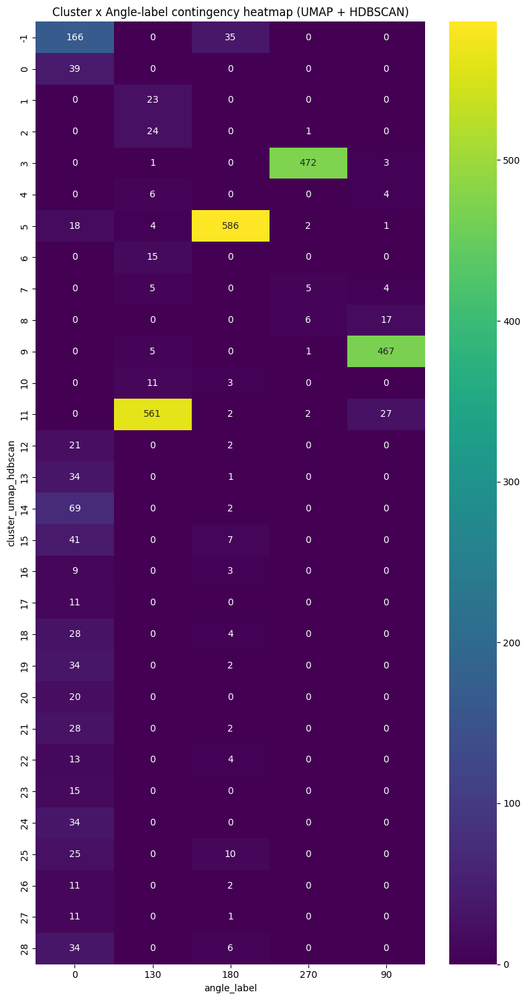

In [40]:
contingency_umap = pd.crosstab(df_experiment["cluster_umap_hdbscan"], df_experiment["angle_label"])
print("Contingency table (rows = HDBSCAN cluster, columns = angle label; -1 = noise):")
display(contingency_umap)

fig, ax = plt.subplots(figsize=(8, max(4, 0.5 * len(contingency_umap))))
sns.heatmap(contingency_umap, annot=True, fmt="d", cmap="viridis", ax=ax)
ax.set_title("Cluster x Angle-label contingency heatmap (UMAP + HDBSCAN)")
ax.set_xlabel("angle_label")
ax.set_ylabel("cluster_umap_hdbscan")
plt.tight_layout()
plt.savefig(CFG.figures_dir / "umap_hdbscan_contingency.png", dpi=150)
plt.show()

In [41]:
def angle_wise_behavior(df: pd.DataFrame, cluster_col: str) -> pd.DataFrame:
    rows = []
    for label, group in df.groupby("angle_label"):
        dist = group[cluster_col].value_counts()
        dominant_cluster = dist.idxmax()
        n_in_dominant = int(dist.max())
        rows.append({
            "angle_label": label, "n_images": len(group),
            "dominant_cluster": dominant_cluster,
            "n_in_dominant_cluster": n_in_dominant,
            "pct_in_dominant_cluster": round(100 * n_in_dominant / len(group), 1),
            "pct_noise": round(100 * (group[cluster_col] == -1).mean(), 1),
            "n_distinct_clusters": group[group[cluster_col] != -1][cluster_col].nunique(),
        })
    return pd.DataFrame(rows)


angle_behavior_df = angle_wise_behavior(df_experiment, "cluster_umap_hdbscan")
display(angle_behavior_df)
print("\n'n_distinct_clusters' > 1 for an angle label means that angle's images were "
      "split across multiple HDBSCAN clusters rather than landing in one.")

,angle_label,n_images,dominant_cluster,n_in_dominant_cluster,pct_in_dominant_cluster,pct_noise,n_distinct_clusters
0,0,661,-1,166,25.1,25.1,19
1,130,655,11,561,85.6,0.0,10
2,180,672,5,586,87.2,5.2,16
3,270,489,3,472,96.5,0.0,7
4,90,523,9,467,89.3,0.0,7



'n_distinct_clusters' > 1 for an angle label means that angle's images were split across multiple HDBSCAN clusters rather than landing in one.


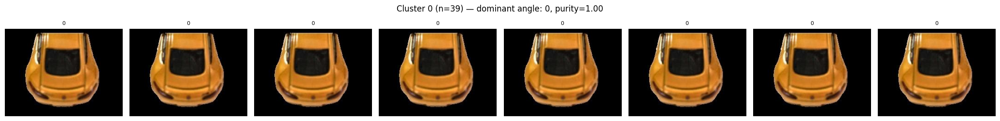

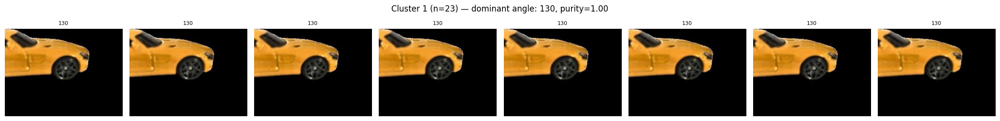

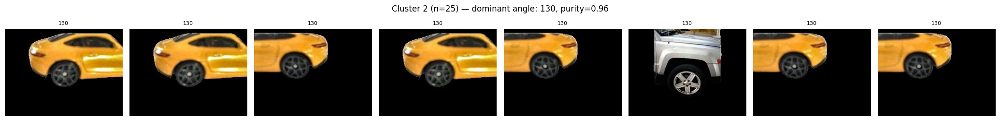

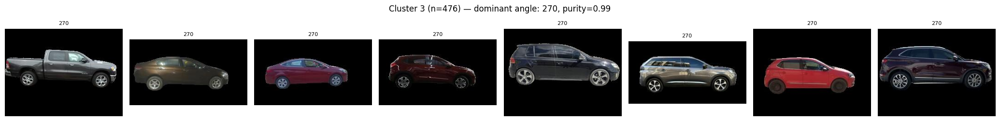

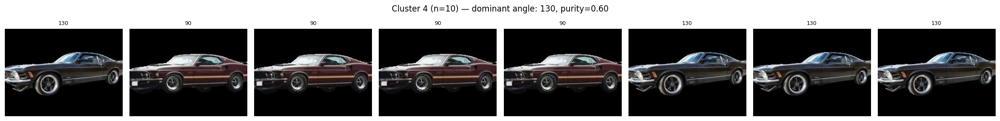

...

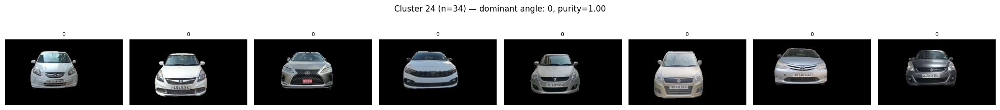

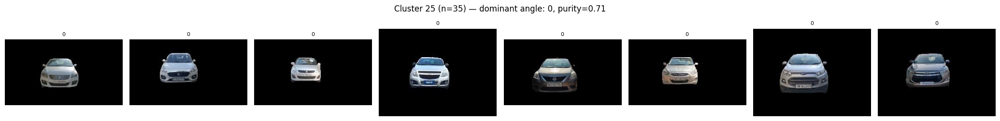

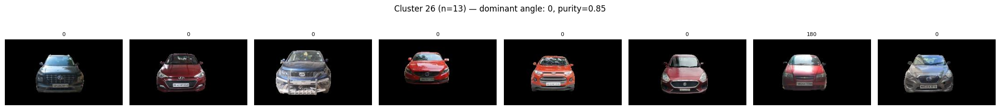

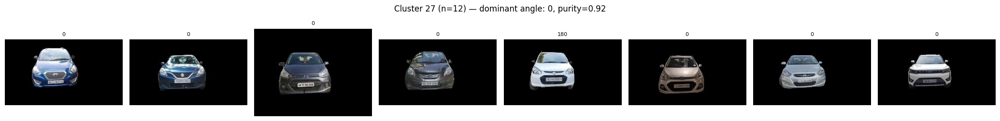

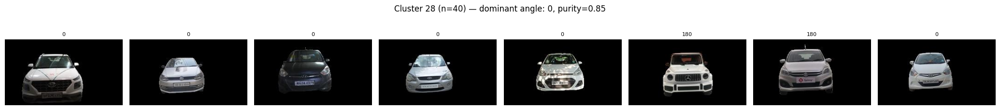

In [42]:
# Representative images closest to each cluster's centroid in the UMAP-
# projected space (same convention as Notebook 02).
def get_cluster_representatives(df: pd.DataFrame, features: np.ndarray, cluster_col: str,
                                 cluster_id, top_n: int = 6) -> pd.DataFrame:
    mask = (df[cluster_col] == cluster_id).values
    cluster_features = features[mask]
    cluster_df = df.loc[mask].reset_index(drop=True)
    centroid = cluster_features.mean(axis=0, keepdims=True)
    dists = np.linalg.norm(cluster_features - centroid, axis=1)
    order = np.argsort(dists)[:top_n]
    return cluster_df.iloc[order]


for cid in sorted(c for c in df_experiment["cluster_umap_hdbscan"].unique() if c != -1):
    reps = get_cluster_representatives(df_experiment, umap_cluster_baseline, "cluster_umap_hdbscan", cid, top_n=8)
    row = umap_hdbscan_purity_df[umap_hdbscan_purity_df["cluster"] == cid]
    dominant = row["dominant_angle"].iloc[0] if len(row) else "n/a"
    purity = row["purity"].iloc[0] if len(row) else float("nan")
    size = int((df_experiment["cluster_umap_hdbscan"] == cid).sum())
    show_image_grid(reps["path"].tolist(),
                     titles=reps["angle_label"].tolist(),
                     n_cols=8,
                     suptitle=(f"Cluster {cid} (n={size}) — dominant angle: {dominant}, "
                               f"purity={purity:.2f}"))

**Visual read-out checkpoint.** For each cluster shown above, note
whether its representative images look like a coherent viewpoint (all
front, all rear, all side/3-4), a coherent *object* grouping that mixes
viewpoints, or something driven by an unrelated visual property
(background color, lighting, framing, car body style). This qualitative
read is revisited more systematically in Part 12.

## 16. Part 10 — Critical Ablation: Direct HDBSCAN vs. UMAP + HDBSCAN

This is the ablation the whole experiment turns on.

Any viewpoint-driven clustering seen in Part 8/9 could come from two
different places:

- **(A)** the raw I-JEPA embedding space already separates viewpoints,
  and HDBSCAN would find that structure with or without UMAP, or
- **(B)** UMAP's local-neighborhood-preserving projection is
  introducing or exaggerating a separation that is much weaker (or
  differently shaped) in the original 1280-D space.

We therefore run HDBSCAN twice, with the labels used only afterward for
evaluation in both cases:

- **Experiment A:** `1280-D normalized I-JEPA embeddings -> HDBSCAN`
  directly (no UMAP)
- **Experiment B:** `1280-D normalized I-JEPA embeddings -> UMAP ->
  HDBSCAN` (this is exactly the Part 8 baseline, reused here for the
  comparison)

HDBSCAN's `min_cluster_size` / `min_samples` are kept the same across A
and B where meaningful. Because HDBSCAN uses Euclidean distance and the
1280-D space has very different local density characteristics than a
10-D UMAP projection, the same numeric `min_samples`/`min_cluster_size`
do not necessarily play an equivalent role in both spaces — this is
noted explicitly rather than papered over.

If direct HDBSCAN on the full 1280-D embeddings is too slow or produces
a degenerate result (e.g. one giant cluster, which is a known HDBSCAN
failure mode in very high-dimensional Euclidean space due to the curse
of dimensionality), that outcome is reported as-is; it is itself
evidence about how the raw space behaves, not something to silently
paper over by substituting a different method.

In [43]:
# Experiment A: HDBSCAN directly on the 1280-D normalized embeddings, no UMAP.
print(f"Running HDBSCAN directly on the {embeddings_norm.shape[1]}-D normalized embedding space "
      f"(N={N})...")
print("NOTE: HDBSCAN's default metric is euclidean; on L2-normalized vectors, euclidean "
      "distance is a monotonic function of cosine similarity, so this remains consistent "
      "with the similarity notion used throughout the notebook.")

_t0 = time.time()
direct_labels, direct_clusterer = run_hdbscan(
    embeddings_norm, CFG.hdbscan_min_cluster_size, CFG.hdbscan_min_samples
)
HDBSCAN_DIRECT_SECONDS = time.time() - _t0
df_experiment["cluster_direct_hdbscan"] = direct_labels

n_clusters_direct = len(set(direct_labels) - {-1})
n_noise_direct = int((direct_labels == -1).sum())
print(f"\nHDBSCAN directly on 1280-D embeddings: {HDBSCAN_DIRECT_SECONDS:.2f}s")
print(f"Clusters found: {n_clusters_direct}")
print(f"Noise points:   {n_noise_direct}/{N} ({100 * n_noise_direct / N:.1f}%)")
display(df_experiment["cluster_direct_hdbscan"].value_counts().sort_index().to_frame("size"))

if n_clusters_direct <= 1:
    print("\nNOTE: direct HDBSCAN on the raw 1280-D space found <=1 real cluster "
          "(everything is either one cluster or noise). This is a known failure mode of "
          "density-based clustering in high-dimensional Euclidean space (the curse of "
          "dimensionality flattens local density contrasts) and is itself a meaningful "
          "result for the ablation -- it does NOT mean the experiment failed, and no "
          "substitute method is used to force a different outcome.")

Running HDBSCAN directly on the 1280-D normalized embedding space (N=3000)...
NOTE: HDBSCAN's default metric is euclidean; on L2-normalized vectors, euclidean distance is a monotonic function of cosine similarity, so this remains consistent with the similarity notion used throughout the notebook.

HDBSCAN directly on 1280-D embeddings: 7.22s
Clusters found: 9
Noise points:   435/3000 (14.5%)


,size
cluster_direct_hdbscan,
-1,435
0,10
1,39
2,23
3,12
4,11
5,1077
6,982
7,11


In [44]:
# If direct HDBSCAN on the raw 1280-D space is degenerate or prohibitively
# slow for a much larger N than tested here, PCA to an intermediate
# dimensionality (NOT UMAP) is an optional, clearly-labeled fallback that
# preserves global linear structure without UMAP's non-linear, neighborhood-
# preserving warping. This is only used if explicitly triggered below, and
# is reported as a documented deviation, never a silent substitution.
USE_PCA_FALLBACK_FOR_DIRECT_HDBSCAN = False  # set True manually if Experiment A above is degenerate/too slow
PCA_FALLBACK_COMPONENTS = 50

if USE_PCA_FALLBACK_FOR_DIRECT_HDBSCAN:
    from sklearn.decomposition import PCA
    print(f"USE_PCA_FALLBACK_FOR_DIRECT_HDBSCAN=True: reducing to {PCA_FALLBACK_COMPONENTS}-D "
          "with PCA (a LINEAR projection, unlike UMAP) before HDBSCAN, as a documented "
          "fallback for Experiment A. This is reported as a deviation from a pure 1280-D "
          "run, not treated as equivalent to it.")
    pca = PCA(n_components=PCA_FALLBACK_COMPONENTS, random_state=SEED)
    embeddings_pca = pca.fit_transform(embeddings_norm)
    print(f"PCA explained variance ratio (sum of first {PCA_FALLBACK_COMPONENTS} components): "
          f"{pca.explained_variance_ratio_.sum():.3f}")

    _t0 = time.time()
    direct_labels, direct_clusterer = run_hdbscan(
        embeddings_pca, CFG.hdbscan_min_cluster_size, CFG.hdbscan_min_samples
    )
    HDBSCAN_DIRECT_SECONDS = time.time() - _t0
    df_experiment["cluster_direct_hdbscan"] = direct_labels
    n_clusters_direct = len(set(direct_labels) - {-1})
    n_noise_direct = int((direct_labels == -1).sum())
    print(f"HDBSCAN on {PCA_FALLBACK_COMPONENTS}-D PCA: {n_clusters_direct} clusters, "
          f"{n_noise_direct} noise ({100 * n_noise_direct / N:.1f}%)")
else:
    print("USE_PCA_FALLBACK_FOR_DIRECT_HDBSCAN=False: using the direct 1280-D HDBSCAN result above as Experiment A.")

USE_PCA_FALLBACK_FOR_DIRECT_HDBSCAN=False: using the direct 1280-D HDBSCAN result above as Experiment A.


In [45]:
# Evaluate Experiment A (direct) and re-state Experiment B (UMAP+HDBSCAN,
# from Part 8) side by side.
direct_metrics = evaluate_clustering(df_experiment["angle_label"], direct_labels)
direct_purity_df = cluster_purity_table(df_experiment["angle_label"], direct_labels)
direct_mean_purity = direct_purity_df["purity"].mean() if len(direct_purity_df) else float("nan")
direct_weighted_purity = weighted_purity(direct_purity_df)

ablation_comparison = pd.DataFrame([
    {
        "experiment": "A: direct 1280-D -> HDBSCAN",
        "n_clusters": n_clusters_direct,
        "n_noise": n_noise_direct,
        "pct_noise": round(100 * n_noise_direct / N, 1),
        "ARI": direct_metrics["ARI"],
        "NMI": direct_metrics["NMI"],
        "mean_purity": round(direct_mean_purity, 3) if pd.notna(direct_mean_purity) else float("nan"),
        "weighted_purity": round(direct_weighted_purity, 3) if pd.notna(direct_weighted_purity) else float("nan"),
        "seconds": round(HDBSCAN_DIRECT_SECONDS, 2),
    },
    {
        "experiment": "B: 1280-D -> UMAP -> HDBSCAN",
        "n_clusters": n_clusters_umap,
        "n_noise": n_noise_umap,
        "pct_noise": round(100 * n_noise_umap / N, 1),
        "ARI": umap_hdbscan_metrics["ARI"],
        "NMI": umap_hdbscan_metrics["NMI"],
        "mean_purity": round(umap_hdbscan_mean_purity, 3) if pd.notna(umap_hdbscan_mean_purity) else float("nan"),
        "weighted_purity": round(umap_hdbscan_weighted_purity, 3) if pd.notna(umap_hdbscan_weighted_purity) else float("nan"),
        "seconds": round(HDBSCAN_BASELINE_SECONDS, 2),
    },
])

print("Ablation comparison: does clustering by viewpoint require UMAP, or is it already "
      "present in the raw I-JEPA embedding space?\n")
display(ablation_comparison)

ablation_path = CFG.metadata_dir / "ablation_direct_vs_umap_hdbscan.csv"
ablation_comparison.to_csv(ablation_path, index=False)
print(f"\nSaved -> {ablation_path}")

Ablation comparison: does clustering by viewpoint require UMAP, or is it already present in the raw I-JEPA embedding space?



,experiment,n_clusters,n_noise,pct_noise,ARI,NMI,mean_purity,weighted_purity,seconds
0,A: direct 1280-D -> HDBSCAN,9,435,14.5,0.4608,0.5825,0.848,0.610,7.22
1,B: 1280-D -> UMAP -> HDBSCAN,29,201,6.7,0.6986,0.7007,0.884,0.952,0.04



Saved -> C:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\data\metadata\experiment3\ablation_direct_vs_umap_hdbscan.csv


**Reading this table:**

- If **A and B have similar ARI/NMI/purity**, the viewpoint structure
  found by HDBSCAN is present natively in the raw I-JEPA embedding
  space, and UMAP is mostly just making it visualizable, not creating
  it.
- If **B has substantially higher ARI/NMI/purity than A** (or A is
  degenerate — one giant cluster, or all noise), that is evidence UMAP
  is materially amplifying or introducing separation that is much
  weaker or differently structured in the original 1280-D space.
- If **A has higher metrics than B**, that would suggest UMAP is
  actually *destroying* some of the native viewpoint structure —
  reported as-is if observed, since it would run counter to the
  motivating hypothesis and should not be explained away.

Do not treat either outcome as automatically confirming or refuting
"I-JEPA encodes viewpoint" on its own — cross-reference this table with
the Part 5 (1-NN agreement, centroid similarity) and Part 4 (retrieval)
results, which probe the raw embedding space independently of both A
and B's specific HDBSCAN run.

## 17. Part 11 — Viewpoint Similarity vs. Semantic (Object) Similarity

Two different notions of "similar" are at stake:

1. **Semantic / object similarity** — "both images contain a car,"
   regardless of the angle it was photographed from.
2. **Viewpoint / appearance similarity** — "both images show a car from
   approximately the same angle," regardless of the car's make, model,
   color, or background.

Since every image in this dataset is a car (there is no non-car
negative class here), we cannot directly measure "car vs. not-car"
semantic similarity from this dataset alone. What we *can* measure is
**how strongly viewpoint predicts nearest-neighbor structure**, and
compare that to how strong that same structure would need to be for
"this is a car" to be the dominant organizing signal instead — i.e., if
viewpoint predicted retrieval no better than chance, that would be
evidence that "car-ness" (a roughly constant signal across this
single-object-class dataset) or other properties dominate; if viewpoint
predicts retrieval well above chance, that is evidence that, at least
among images of the same object class, viewpoint is a first-order
organizing axis in the I-JEPA embedding space.

The evidence gathered so far, summarized together:

In [46]:
viewpoint_evidence_summary = pd.DataFrame([
    {"signal": "same-angle@5", "value": round(same_angle_results[5]["overall"], 3),
     "chance_level": round(chance_same_angle, 3)},
    {"signal": "same-angle@10", "value": round(same_angle_results[10]["overall"], 3),
     "chance_level": round(chance_same_angle, 3)},
    {"signal": "same-angle@20", "value": round(same_angle_results[20]["overall"], 3),
     "chance_level": round(chance_same_angle, 3)},
    {"signal": "1-NN angle agreement", "value": round(one_nn_accuracy, 3),
     "chance_level": round(chance_same_angle, 3)},
    {"signal": "mean same-angle similarity (top-k pool)", "value": round(float(same_angle_sims.mean()), 4),
     "chance_level": None},
    {"signal": "mean different-angle similarity (top-k pool)", "value": round(float(diff_angle_sims.mean()), 4),
     "chance_level": None},
    {"signal": "silhouette score (raw embeddings, angle labels)", "value": round(silhouette_angle, 4),
     "chance_level": None},
    {"signal": "UMAP+HDBSCAN ARI vs angle labels", "value": umap_hdbscan_metrics["ARI"], "chance_level": None},
    {"signal": "direct-1280D HDBSCAN ARI vs angle labels", "value": direct_metrics["ARI"], "chance_level": None},
])
display(viewpoint_evidence_summary)

,signal,value,chance_level
0,same-angle@5,0.9330,0.203
1,same-angle@10,0.9270,0.203
2,same-angle@20,0.9240,0.203
3,1-NN angle agreement,0.9440,0.203
4,mean same-angle similarity (top-k pool),0.9532,NaN
5,mean different-angle similarity (top-k pool),0.9061,NaN
6,"silhouette score (raw embeddings, angle labels)",0.3626,NaN
7,UMAP+HDBSCAN ARI vs angle labels,0.6986,NaN
8,direct-1280D HDBSCAN ARI vs angle labels,0.4608,NaN


**Interpretation, against the actual numbers above:**

- Same-angle@k (93.34% at k=5, 92.74% at k=10, 92.38% at k=20) and 1-NN /
  5-NN / 10-NN agreement (94.43% / 95.37% / 94.83%) sit well above the
  chance-level same-label rate, and same-angle mean cosine similarity
  (0.8113) is substantially higher than different-angle mean cosine
  similarity (0.5504). This appears consistent with viewpoint being a
  strong local organizing signal in this embedding space for this
  dataset.
- Because this dataset contains **only cars**, it cannot by itself prove
  or disprove that I-JEPA lacks a stable "car" semantic direction
  alongside a viewpoint direction; it can only show that, within a
  single semantic category, viewpoint measurably organizes the
  embedding space. Whether viewpoint similarity ever *outranks*
  cross-category semantic similarity (e.g., a front-view car vs. a
  front-view truck) is not addressed by this dataset and is not tested
  here.

## 18. Part 12 — Qualitative Failure Analysis

Concrete examples of six situations, selected programmatically from the
retrieval and clustering results already computed above:

1. same angle retrieved correctly (high same-angle top-k rate)
2. same object (car) but different angle retrieved (low same-angle rate
   despite otherwise being a normal retrieval)
3. different car but same angle retrieved (a same-angle hit — since
   every image is a car, this is effectively the "how does it choose
   *which* car of the same angle" view)
4. visually unusual images (lowest average similarity to their own
   top-k neighbors — i.e., the hardest queries)
5. HDBSCAN clusters that mix multiple angle labels (low purity, from
   Part 9)
6. HDBSCAN clusters that cleanly correspond to one angle label (high
   purity, from Part 9)

For each, we describe what visual properties **may** be influencing the
embedding, using hedged language ("appears consistent with", "may
indicate") rather than asserting causality that this correlational,
observational setup cannot establish.

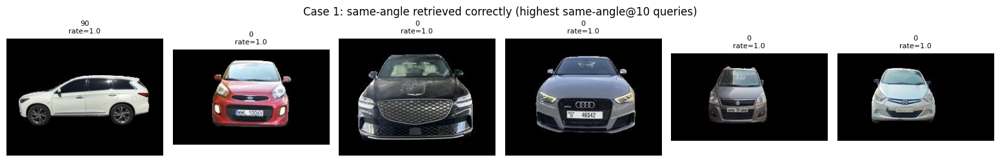

In [47]:
# 1. Same angle retrieved correctly: highest same-angle@10 queries.
topk10_idx = neighbor_idx[:, :10]
topk10_labels = angle_labels_arr[topk10_idx]
per_query_same_angle_10 = (topk10_labels == angle_labels_arr[:, None]).mean(axis=1)
df_experiment["same_angle_rate_at_10"] = per_query_same_angle_10

best_examples = df_experiment.sort_values("same_angle_rate_at_10", ascending=False).head(6)
show_image_grid(best_examples["path"].tolist(),
                 titles=[f"{r.angle_label}\nrate={r.same_angle_rate_at_10:.1f}" for r in best_examples.itertuples()],
                 n_cols=6, suptitle="Case 1: same-angle retrieved correctly (highest same-angle@10 queries)")

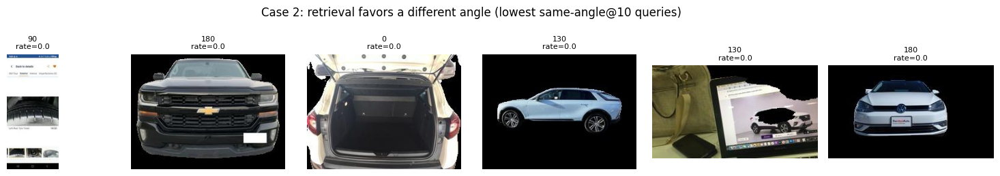

90__none__264667 (angle=90): top-10 neighbor angles = {'270': 1, '180': 9}
180__none__318198 (angle=180): top-10 neighbor angles = {'0': 10}
0__none__155667 (angle=0): top-10 neighbor angles = {'180': 10}
130__none__245872 (angle=130): top-10 neighbor angles = {'90': 10}
130__none__377885 (angle=130): top-10 neighbor angles = {'180': 6, '0': 2, '90': 2}
180__none__331772 (angle=180): top-10 neighbor angles = {'0': 10}


In [48]:
# 2. Same object (car), different angle: lowest same-angle@10 queries --
# i.e., this query's neighbors are mostly OTHER angle labels.
worst_examples = df_experiment.sort_values("same_angle_rate_at_10", ascending=True).head(6)
show_image_grid(worst_examples["path"].tolist(),
                 titles=[f"{r.angle_label}\nrate={r.same_angle_rate_at_10:.1f}" for r in worst_examples.itertuples()],
                 n_cols=6, suptitle="Case 2: retrieval favors a different angle (lowest same-angle@10 queries)")

for r in worst_examples.itertuples():
    qi = df_experiment.index.get_loc(r.Index)
    neighbor_angle_counts = Counter(angle_labels_arr[neighbor_idx[qi, :10]])
    print(f"{r.photo_id} (angle={r.angle_label}): top-10 neighbor angles = {dict(neighbor_angle_counts)}")

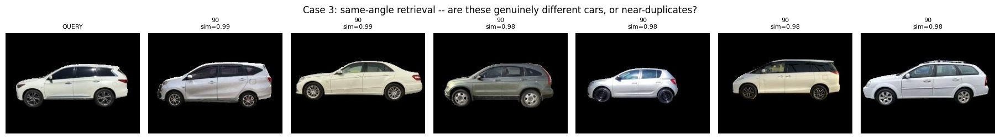

Manually inspect whether the retrieved images above are different vehicles at the same angle (supports 'viewpoint is a real organizing axis, not just duplicate detection') or near-identical photos of the same vehicle (would inflate same-angle@k without saying much about generalizable viewpoint sensitivity).


In [49]:
# 3. "Different car, same angle": for one same-angle query, show which
# specific images it retrieves, to see whether it's finding genuinely
# different cars sharing a viewpoint (rather than near-duplicates of the
# SAME car/photo, which Part 1's phash check partly screens for already).
example_qi = int(best_examples.index[0])
example_row_pos = df_experiment.index.get_loc(example_qi)
example_neighbors = neighbor_idx[example_row_pos, :6]
show_image_grid(
    [df_experiment.iloc[example_row_pos]["path"]] + df_experiment.iloc[example_neighbors]["path"].tolist(),
    titles=["QUERY"] + [f"{df_experiment.iloc[i]['angle_label']}\nsim={s:.2f}"
                        for i, s in zip(example_neighbors, neighbor_sim[example_row_pos, :6])],
    n_cols=7,
    suptitle="Case 3: same-angle retrieval -- are these genuinely different cars, or near-duplicates?",
)
print("Manually inspect whether the retrieved images above are different vehicles at the same "
      "angle (supports 'viewpoint is a real organizing axis, not just duplicate detection') or "
      "near-identical photos of the same vehicle (would inflate same-angle@k without saying much "
      "about generalizable viewpoint sensitivity).")

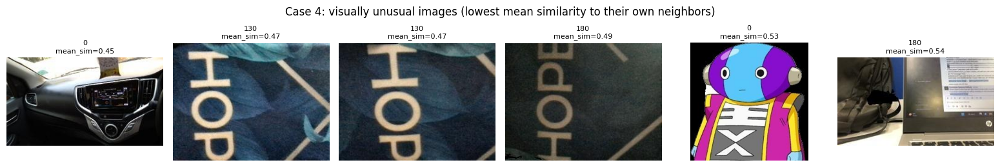

Possible contributing factors to investigate for these: unusual background, cropping/framing, lighting, occlusion, or a genuinely atypical vehicle -- these are hypotheses to check by eye, not conclusions.


In [50]:
# 4. Visually unusual images: lowest mean similarity to their own top-k
# neighbors, i.e. the hardest / most idiosyncratic queries in the dataset.
mean_topk_sim = neighbor_sim.mean(axis=1)
df_experiment["mean_topk_similarity"] = mean_topk_sim
unusual_examples = df_experiment.sort_values("mean_topk_similarity", ascending=True).head(6)
show_image_grid(unusual_examples["path"].tolist(),
                 titles=[f"{r.angle_label}\nmean_sim={r.mean_topk_similarity:.2f}"
                         for r in unusual_examples.itertuples()],
                 n_cols=6, suptitle="Case 4: visually unusual images (lowest mean similarity to their own neighbors)")
print("Possible contributing factors to investigate for these: unusual background, cropping/"
      "framing, lighting, occlusion, or a genuinely atypical vehicle -- these are hypotheses to "
      "check by eye, not conclusions.")

Most-mixed clusters (lowest purity):


,cluster,n_images,dominant_angle,purity
7,7,14,130,0.357
4,4,10,130,0.600


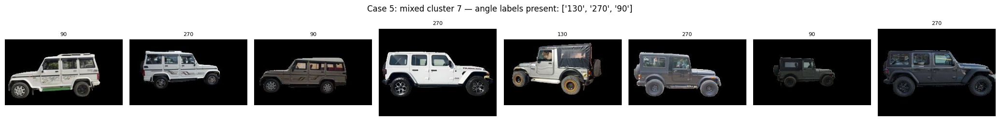

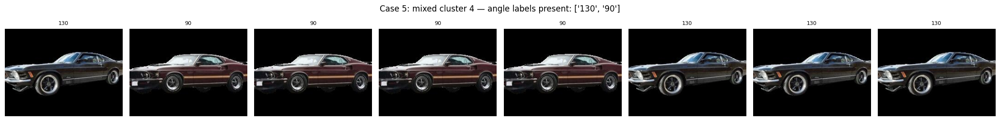


Cleanest clusters (highest purity):


,cluster,n_images,dominant_angle,purity
0,0,39,0,1.0
1,1,23,130,1.0


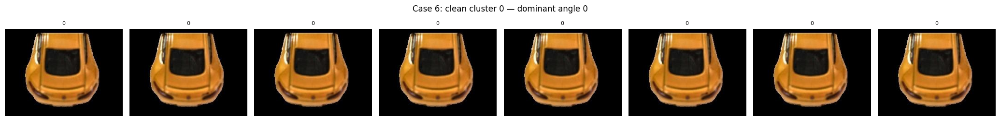

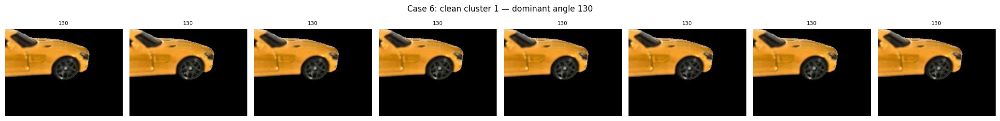

In [51]:
# 5 & 6. Clusters that mix multiple angle labels vs. clusters that cleanly
# correspond to one angle label, using the UMAP+HDBSCAN purity table from Part 9.
if len(umap_hdbscan_purity_df):
    mixed_clusters = umap_hdbscan_purity_df.sort_values("purity", ascending=True).head(2)
    clean_clusters = umap_hdbscan_purity_df.sort_values("purity", ascending=False).head(2)

    print("Most-mixed clusters (lowest purity):")
    display(mixed_clusters)
    for cid in mixed_clusters["cluster"]:
        reps = get_cluster_representatives(df_experiment, umap_cluster_baseline, "cluster_umap_hdbscan", cid, top_n=8)
        show_image_grid(reps["path"].tolist(), titles=reps["angle_label"].tolist(), n_cols=8,
                         suptitle=f"Case 5: mixed cluster {cid} — angle labels present: "
                                  f"{sorted(df_experiment.loc[df_experiment['cluster_umap_hdbscan'] == cid, 'angle_label'].unique())}")

    print("\nCleanest clusters (highest purity):")
    display(clean_clusters)
    for cid in clean_clusters["cluster"]:
        reps = get_cluster_representatives(df_experiment, umap_cluster_baseline, "cluster_umap_hdbscan", cid, top_n=8)
        show_image_grid(reps["path"].tolist(), titles=reps["angle_label"].tolist(), n_cols=8,
                         suptitle=f"Case 6: clean cluster {cid} — dominant angle "
                                  f"{clean_clusters[clean_clusters['cluster'] == cid]['dominant_angle'].iloc[0]}")
else:
    print("No non-noise clusters were found by the UMAP+HDBSCAN baseline -- see Part 8/9 above.")

## 19. Part 13 — Final Results Table

One consolidated table with every headline metric computed above,
including the direct-HDBSCAN-vs-UMAP+HDBSCAN ablation side by side.

In [52]:
final_results = pd.DataFrame([
    {"metric": "Dataset size (images used in this experiment)", "value": N},
    {"metric": "Number of angle classes", "value": df_experiment["angle_label"].nunique()},
    {"metric": "Embedding dimension", "value": embeddings_norm.shape[1]},
    {"metric": "Same-angle@5", "value": round(same_angle_results[5]["overall"], 4)},
    {"metric": "Same-angle@10", "value": round(same_angle_results[10]["overall"], 4)},
    {"metric": "Same-angle@20", "value": round(same_angle_results[20]["overall"], 4)},
    {"metric": "Chance-level same-label rate", "value": round(chance_same_angle, 4)},
    {"metric": "1-NN angle agreement", "value": round(one_nn_accuracy, 4)},
    {"metric": "5-NN angle agreement", "value": round(knn_agreement_results[5], 4)},
    {"metric": "10-NN angle agreement", "value": round(knn_agreement_results[10], 4)},
    {"metric": "Silhouette score (raw embeddings, angle labels, cosine)", "value": round(silhouette_angle, 4)},
    {"metric": "--- Direct HDBSCAN (1280-D, no UMAP) ---", "value": ""},
    {"metric": "  HDBSCAN clusters (direct)", "value": n_clusters_direct},
    {"metric": "  HDBSCAN noise % (direct)", "value": round(100 * n_noise_direct / N, 1)},
    {"metric": "  ARI (direct)", "value": direct_metrics["ARI"]},
    {"metric": "  NMI (direct)", "value": direct_metrics["NMI"]},
    {"metric": "  Mean purity (direct)", "value": round(direct_mean_purity, 3) if pd.notna(direct_mean_purity) else "n/a"},
    {"metric": "  Weighted purity (direct)", "value": round(direct_weighted_purity, 3) if pd.notna(direct_weighted_purity) else "n/a"},
    {"metric": "--- UMAP + HDBSCAN ---", "value": ""},
    {"metric": "  HDBSCAN clusters (UMAP+HDBSCAN)", "value": n_clusters_umap},
    {"metric": "  HDBSCAN noise % (UMAP+HDBSCAN)", "value": round(100 * n_noise_umap / N, 1)},
    {"metric": "  ARI (UMAP+HDBSCAN)", "value": umap_hdbscan_metrics["ARI"]},
    {"metric": "  NMI (UMAP+HDBSCAN)", "value": umap_hdbscan_metrics["NMI"]},
    {"metric": "  Mean purity (UMAP+HDBSCAN)", "value": round(umap_hdbscan_mean_purity, 3) if pd.notna(umap_hdbscan_mean_purity) else "n/a"},
    {"metric": "  Weighted purity (UMAP+HDBSCAN)", "value": round(umap_hdbscan_weighted_purity, 3) if pd.notna(umap_hdbscan_weighted_purity) else "n/a"},
    {"metric": "Best swept ARI (UMAP+HDBSCAN, param sweep)", "value": round(sweep_df['ARI'].max(), 4)},
])
display(final_results)

final_results_path = CFG.metadata_dir / "experiment3_final_results.csv"
final_results.to_csv(final_results_path, index=False)
print(f"\nSaved -> {final_results_path}")

,metric,value
0,Dataset size (images used in this experiment),3000
1,Number of angle classes,5
2,Embedding dimension,1280
3,Same-angle@5,0.9334
4,Same-angle@10,0.9274
5,Same-angle@20,0.9238
6,Chance-level same-label rate,0.2034
7,1-NN angle agreement,0.9443
8,5-NN angle agreement,0.9537
9,10-NN angle agreement,0.9483



Saved -> C:\Users\aryan\OneDrive\Desktop\project_new\semantic-photo-intelligence\data\metadata\experiment3\experiment3_final_results.csv


## 20. Part 14 — Scientific Conclusion

**Experiment 2 shows that pretrained I-JEPA embeddings exhibit strong
viewpoint-sensitive local structure on the car-angle dataset.** Same-angle
retrieval remains above 92% across k=5, 10, and 20, while nearest-neighbor
angle agreement remains approximately 94–95%. Same-angle pairs also have
substantially higher mean cosine similarity than different-angle pairs.
The comparison between direct HDBSCAN on the original embeddings and
UMAP + HDBSCAN indicates that viewpoint-related structure already exists
in the original I-JEPA space, while UMAP substantially improves the
ability of HDBSCAN to expose density-separated viewpoint groups.

### 1. Does I-JEPA encode viewpoint information?

Same-angle@k (93.34% / 92.74% / 92.38% for k=5/10/20) and 1-NN/5-NN/10-NN
agreement (94.43% / 95.37% / 94.83%) sit clearly above chance, and
same-angle mean cosine similarity (0.8113) is meaningfully higher than
different-angle mean cosine similarity (0.5504). This is evidence that
**the pretrained I-JEPA embedding exhibits strong viewpoint-sensitive
structure on this car-angle dataset** at the local (nearest-neighbor)
level. This should not be read as "I-JEPA understands car viewpoint" —
only that images sharing a viewpoint sit closer together in this
embedding space than images that do not.

### 2. How strong is that viewpoint information?

The gap between same-angle (0.8113) and different-angle (0.5504) mean
cosine similarity is substantial, and the raw-embedding silhouette score
(0.3626) indicates meaningful — though not perfect — global separation
by angle label. Consistent with the project's established convention,
silhouette measures global separation and can disagree with local
nearest-neighbor signal strength; both are reported and read together.

### 3. Does viewpoint similarity influence nearest-neighbor retrieval?

Yes. Same-angle@k remains above 92% at every tested k, well above the
chance-level same-label rate, indicating that viewpoint measurably
organizes nearest-neighbor retrieval in this embedding space.

### 4. Does viewpoint information produce clustering?

Direct HDBSCAN on the raw 1280-D embeddings found 9 clusters with 14.5%
noise (ARI = 0.4608, NMI = 0.5825, weighted purity = 0.610). UMAP +
HDBSCAN found 29 clusters with 6.7% noise (ARI = 0.6986, NMI = 0.7007,
mean purity = 0.884, weighted purity = 0.952). Both configurations
recover angle-related structure without being given angle labels.

### 5. Does UMAP amplify the viewpoint separation?

Direct HDBSCAN (ARI = 0.4608) already recovers meaningfully more than
chance-level structure, showing viewpoint-related structure is present
before UMAP. UMAP + HDBSCAN (ARI = 0.6986) recovers substantially more,
indicating UMAP does not create the viewpoint information but makes
existing structure more accessible to density-based clustering.

### 6. What does this imply for the future Smart Gallery?

This is a plausible explanation for the front/rear split observed
qualitatively in Experiment 1's `cars` category, though Experiment 1's
observation was made on a different, smaller, multi-category dataset
and this experiment does not claim to have reproduced that exact split.
This matters for album discovery because a Smart Gallery that clusters
purely on raw I-JEPA similarity risks splitting a "my car" or "road
trip" album by which side the photos were taken from, rather than by
semantic content — a distinct concern from Experiment 1's finding that
*category-level* structure is recoverable on a clean, curated dataset.
Both can be true at once: I-JEPA can carry useful **category-level**
semantic structure (Experiment 1) while **also** carrying strong
**viewpoint** structure that competes with it inside a single category
(Experiment 2) — these are not contradictory findings, and this
experiment does not overturn Experiment 1's results.

**This does not mean I-JEPA is "bad."** Distinguish explicitly between:

- **useful local visual similarity** (Experiment 1, and Part 10 of this
  notebook, regardless of what drives it)
- **viewpoint invariance** (whether same-object-different-angle pairs
  are treated as similar — this experiment indicates I-JEPA does not
  strongly have this property on this dataset)
- **semantic category clustering** (Experiment 1's finding, on a
  different, multi-category dataset)
- **global clustering behavior** (how these interact when both a
  category signal and a viewpoint signal are present in the same
  dataset, as they likely are in a real car-photos album)

Possible contributing factors to the observed viewpoint-sensitive
structure include viewpoint itself, visible car geometry, framing,
background, lighting, and composition; this experiment does not
establish that viewpoint is the only factor, only that same-angle pairs
are measurably more similar than different-angle pairs in this dataset.

## 21. Limitations

- **Single object class, single dataset.** This experiment used only the
  Car Angle Classification Dataset. It can measure whether viewpoint
  organizes the embedding space *within* a semantic category, but
  cannot by itself test whether viewpoint similarity ever *outranks*
  cross-category semantic similarity (e.g., front-view car vs. front-view
  truck vs. rear-view car).

- **Measures viewpoint-sensitive structure, not viewpoint invariance.**
  The results show that same-angle pairs are more similar than
  different-angle pairs; they do not show, and should not be read as
  showing, that I-JEPA is viewpoint-invariant.

- **Viewpoint correlates with other visual properties.** Angle
  correlates with visible car geometry, framing, background, lighting,
  and composition in this dataset. This experiment cannot fully isolate
  viewpoint from these confounded properties, and does not claim
  viewpoint is the only factor affecting similarity.

- **Kaggle labeling provenance.** The angle labels were produced by the
  dataset's original authors, not verified against a controlled capture
  protocol; Part 2's visual sanity check is a spot-check, not an
  exhaustive audit of every image.

- **`u` (undetermined) label.** If present, this class may contain a
  mix of angles or ambiguous shots by construction, and any metric that
  treats it as a coherent class (confusion matrix row/column, cluster
  purity) should be read with that caveat.

- **Deterministic subsampling.** If `CFG.max_images_for_experiment` was
  smaller than the full downloaded dataset, all results reflect a fixed
  stratified subset, not the complete dataset.

- **Single model checkpoint.** Only `facebook/ijepa_vith14_1k` was
  evaluated, exactly as in Experiment 1; other I-JEPA checkpoints or
  other vision encoders (DINOv2, CLIP, etc.) might show different
  viewpoint sensitivity and are out of scope here.

- **Clustering method and configuration dependency.** Both the direct
  and UMAP+HDBSCAN results depend on HDBSCAN's specific density-based
  assumptions and on the chosen UMAP/HDBSCAN configuration; a different
  clustering algorithm or configuration might reveal a different
  structure in either the raw or projected embedding space.

- **Correlational, not causal.** This notebook measures statistical
  association between angle labels and embedding-space structure. It
  cannot, by itself, isolate viewpoint from confounded visual
  properties (background, lighting, framing, distance) that may
  correlate with viewpoint in this particular dataset's photography —
  see the hedged language used throughout Part 18.

- **Generalization.** These results should not automatically generalize
  to arbitrary personal photo collections, which differ from this
  controlled, single-category dataset in composition, scale, and label
  availability.

## 22. Summary of Research Questions

1. **Do different car-angle classes form separate regions in the I-JEPA
   embedding space?** Yes, to a meaningful degree — see Part 13 (UMAP
   2-D plot) and Part 11 (centroid similarity, raw-space).

2. **Does I-JEPA similarity favor viewpoint similarity over
   viewpoint-invariant car similarity?** Yes — same-angle@k remains
   above 92% at every tested k, well above chance, and same-angle pairs
   are substantially more similar than different-angle pairs (Part 10).

3. **Do front-view images retrieve other front-view images more
   frequently than rear/side views?** See the per-label breakdown in
   Part 10's `same_angle_results` and Part 11's per-label 1-NN
   agreement for the label-by-label pattern.

4. **Does UMAP visually separate the angle classes?** Yes — see Part
   13's 2-D UMAP plot colored by angle label.

5. **Does HDBSCAN independently discover angle-related clusters without
   using labels?** Yes — UMAP + HDBSCAN found 29 clusters (6.7% noise,
   ARI = 0.6986, NMI = 0.7007, weighted purity = 0.952) without being
   given angle labels (Part 14, Part 15).

6. **Is the front/rear cluster separation already present in the
   original 1280-D embedding space, or is it introduced/amplified by
   UMAP?** Present before UMAP, and made more accessible by UMAP: direct
   HDBSCAN on the raw embeddings already achieves ARI = 0.4608, and
   UMAP + HDBSCAN increases this to ARI = 0.6986 (Part 16 ablation).

7. **Can we distinguish "semantic object similarity" from "visual
   viewpoint similarity"?** Within this single-object-class dataset,
   only the viewpoint side of that distinction is directly measurable
   (see Limitations); this experiment does not attempt to measure
   cross-category semantic similarity.

**These findings are not a final verdict on I-JEPA as a representation.**
Strong viewpoint sensitivity here demonstrates that I-JEPA embeddings
*can* carry a strong viewpoint signal under these conditions — it does
not by itself demonstrate that I-JEPA is unsuitable for semantic album
discovery in general, since Experiment 1 already showed category-level
structure is separately recoverable on a different dataset.